# Artificial Intelligence Nanodegree
## Computer Vision Capstone
## Project: Facial Keypoint Detection

---

Welcome to the final Computer Vision project in the Artificial Intelligence Nanodegree program!  

In this project, you’ll combine your knowledge of computer vision techniques and deep learning to build and end-to-end facial keypoint recognition system! Facial keypoints include points around the eyes, nose, and mouth on any face and are used in many applications, from facial tracking to emotion recognition. 

There are three main parts to this project:

**Part 1** : Investigating OpenCV, pre-processing, and face detection

**Part 2** : Training a Convolutional Neural Network (CNN) to detect facial keypoints

**Part 3** : Putting parts 1 and 2 together to identify facial keypoints on any image!

---

**Here's what you need to know to complete the project:*

1. In this notebook, some template code has already been provided for you, and you will need to implement additional functionality to successfully complete this project. You will not need to modify the included code beyond what is requested. 
    
    a. Sections that begin with **'(IMPLEMENTATION)'** in the header indicate that the following block of code will require additional functionality which you must provide. Instructions will be provided for each section, and the specifics of the implementation are marked in the code block with a 'TODO' statement. Please be sure to read the instructions carefully! 


2. In addition to implementing code, there will be questions that you must answer which relate to the project and your implementation. 
    
    a. Each section where you will answer a question is preceded by a **'Question X'** header. 
    
    b. Carefully read each question and provide thorough answers in the following text boxes that begin with **'Answer:'**.

>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut.  Markdown cells can be edited by double-clicking the cell to enter edit mode.

The rubric contains **optional** suggestions for enhancing the project beyond the minimum requirements. If you decide to pursue the "(Optional)" sections, you should include the code in this IPython notebook.

Your project submission will be evaluated based on your answers to *each* of the questions and the code implementations you provide.  

### Steps to Complete the Project

Each part of the notebook is further broken down into separate steps.  Feel free to use the links below to navigate the notebook.

In this project you will get to explore a few of the many computer vision algorithms built into the OpenCV library.  This expansive computer vision library is now [almost 20 years old](https://en.wikipedia.org/wiki/OpenCV#History) and still growing! 

The project itself is broken down into three large parts, then even further into separate steps.  Make sure to read through each step, and complete any sections that begin with **'(IMPLEMENTATION)'** in the header; these implementation sections may contain multiple TODOs that will be marked in code.  For convenience, we provide links to each of these steps below.

**Part 1** : Investigating OpenCV, pre-processing, and face detection

* [Step 0](#step0): Detect Faces Using a Haar Cascade Classifier
* [Step 1](#step1): Add Eye Detection
* [Step 2](#step2): De-noise an Image for Better Face Detection
* [Step 3](#step3): Blur an Image and Perform Edge Detection
* [Step 4](#step4): Automatically Hide the Identity of an Individual

**Part 2** : Training a Convolutional Neural Network (CNN) to detect facial keypoints

* [Step 5](#step5): Create a CNN to Recognize Facial Keypoints
* [Step 6](#step6): Compile and Train the Model
* [Step 7](#step7): Visualize the Loss and Answer Questions

**Part 3** : Putting parts 1 and 2 together to identify facial keypoints on any image!

* [Step 8](#step7): Build a Robust Facial Keypoints Detector (Complete the CV Pipeline)



---
<a id='step0'></a>
## Step 0: Detect Faces Using a Haar Cascade Classifier

Have you ever wondered how Facebook automatically tags images with your friends' faces?   Or how high-end cameras automatically find and focus on a certain person's face?  Applications like these depend heavily on the machine learning task known as *face detection* -  which is the task of automatically finding faces in images containing people.  

At its root face detection is a classification problem - that is a problem of distinguishing between distinct classes of things.  With face detection these distinct classes are 1) images of human faces and 2) everything else. 

We use OpenCV's implementation of [Haar feature-based cascade classifiers](http://docs.opencv.org/trunk/d7/d8b/tutorial_py_face_detection.html) to detect human faces in images.  OpenCV provides many pre-trained face detectors, stored as XML files on [github](https://github.com/opencv/opencv/tree/master/data/haarcascades).  We have downloaded one of these detectors and stored it in the `detector_architectures` directory.


### Import Resources 

In the next python cell, we load in the required libraries for this section of the project.

In [1]:
# Import required libraries for this section
from functools import partial
import numpy as np
import matplotlib.pyplot as plt
import math
import cv2    # OpenCV library for computer vision
from PIL import Image
import matplotlib as mpl
import pickle
import time
from joblib import Parallel, delayed
import gc

%matplotlib inline

%load_ext cython
%load_ext line_profiler
%load_ext autoreload


%autoreload
from core.Imagetools import *
plt.style.use('seaborn')

def clearmem():
    for x in range(19): # :!
        gc.collect()
        K.clear_session()

Next, we load in and display a test image for performing face detection.

*Note*: by default OpenCV assumes the ordering of our image's color channels are Blue, then Green, then Red.  This is slightly out of order with most image types we'll use in these experiments, whose color channels are ordered Red, then Green, then Blue.  In order to switch the Blue and Red channels of our test image around we will use OpenCV's ```cvtColor``` function, which you can read more about by [checking out some of its documentation located here](http://docs.opencv.org/3.2.0/df/d9d/tutorial_py_colorspaces.html).  This is a general utility function that can do other transformations too like converting a color image to grayscale, and transforming a standard color image to HSV color space.

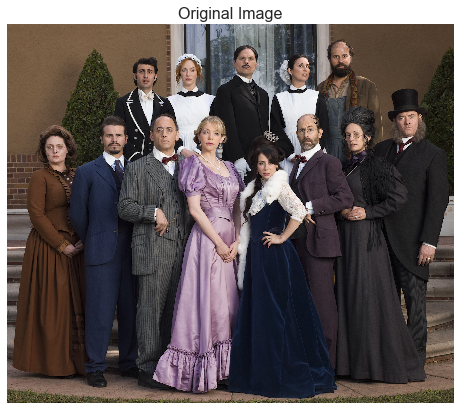

In [2]:
# Load in color image for face detection
image = cv2.imread('images/test_image_1.jpg')

# Convert the image to RGB colorspace
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Plot our image using subplots to specify a size and title
fig = plt.figure(figsize = (8,8))
ax1 = fig.add_subplot(111)
ax1.set_xticks([])
ax1.set_yticks([])

ax1.set_title('Original Image', fontsize=16)
ax1.imshow(image)

There are a lot of people - and faces - in this picture.  13 faces to be exact!  In the next code cell, we demonstrate how to use a Haar Cascade classifier to detect all the faces in this test image.

This face detector uses information about patterns of intensity in an image to reliably detect faces under varying light conditions. So, to use this face detector, we'll first convert the image from color to grayscale. 

Then, we load in the fully trained architecture of the face detector -- found in the file *haarcascade_frontalface_default.xml* - and use it on our image to find faces! 

To learn more about the parameters of the detector see [this post](https://stackoverflow.com/questions/20801015/recommended-values-for-opencv-detectmultiscale-parameters).

Number of faces detected (out of 13) : 13


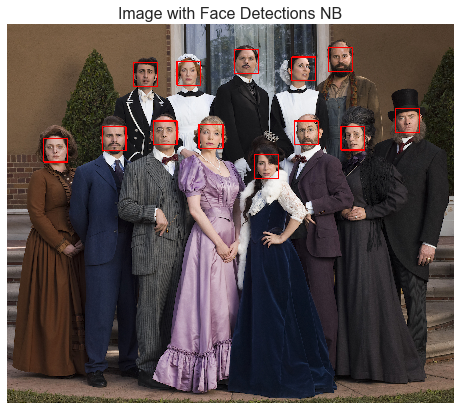

In [3]:
# Convert the RGB  image to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

# Extract the pre-trained face detector from an xml file
face_cascade = cv2.CascadeClassifier('detector_architectures/haarcascade_frontalface_default.xml')

# Detect the faces in image
faces = face_cascade.detectMultiScale(gray, 4, 6)

# Print the number of faces detected in the image
print('Number of faces detected (out of 13) :', len(faces))

# Make a copy of the orginal image to draw face detections on
image_with_detections = np.copy(image)

# Get the bounding box for each detected face
for (x,y,w,h) in faces:
    # Add a red bounding box to the detections image
    cv2.rectangle(image_with_detections, (x,y), (x+w,y+h), (255,0,0), 3)
    

# Display the image with the detections
fig = plt.figure(figsize = (8,8))
ax1 = fig.add_subplot(111)
ax1.set_xticks([])
ax1.set_yticks([])

ax1.set_title('Image with Face Detections NB', fontsize=16)
ax1.imshow(image_with_detections)

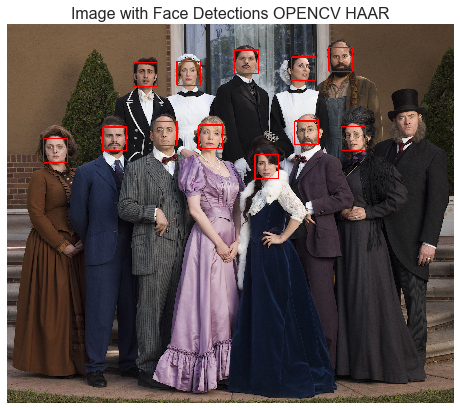

In [4]:
#OPENCV -need to account for hyperparameter
#        depending on individual face dimensions
%autoreload
from core.Imagetools import *

image_with_detections = haarfacescv('images/test_image_1.jpg')

# Display the image with the detections
fig = plt.figure(figsize = (8,8))
ax1 = fig.add_subplot(111)
ax1.set_xticks([])
ax1.set_yticks([])

ax1.set_title('Image with Face Detections OPENCV HAAR', fontsize=16)
ax1.imshow(image_with_detections)

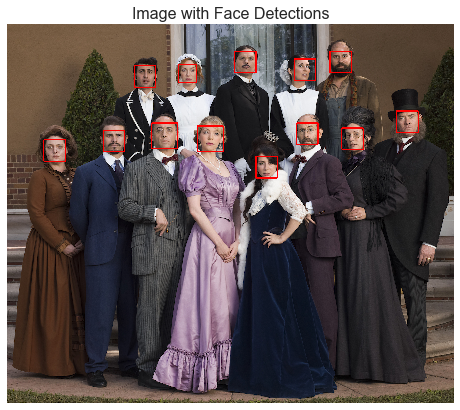

In [5]:
#DLIB HOG+SVM easier to implement and train
%autoreload
from core.Imagetools import *

image_with_detections = hogfacesdlib('images/test_image_1.jpg', 1)

# Display the image with the detections
fig = plt.figure(figsize = (8,8))
ax1 = fig.add_subplot(111)
ax1.set_xticks([])
ax1.set_yticks([])

ax1.set_title('Image with Face Detections', fontsize=16)
ax1.imshow(image_with_detections)

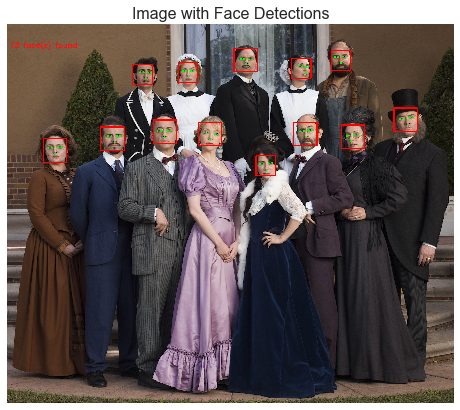

In [6]:
#TODO: #DLIB HOG+MMOD  with cuda and cnn, quite fast
%autoreload
from core.Imagetools import *

image_with_detections = landmarksdlibcnn('images/test_image_1.jpg',1)

# Display the image with the detections
fig = plt.figure(figsize = (8,8))
ax1 = fig.add_subplot(111)
ax1.set_xticks([])
ax1.set_yticks([])

ax1.set_title('Image with Face Detections', fontsize=16)
ax1.imshow(image_with_detections)

In [7]:
image = cv2.imread('images/test_image_1.jpg', 0)
%timeit ilandmarksdlibcnn(image,1)

147 ms ± 1.1 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


In the above code, `faces` is a numpy array of detected faces, where each row corresponds to a detected face.  Each detected face is a 1D array with four entries that specifies the bounding box of the detected face.  The first two entries in the array (extracted in the above code as `x` and `y`) specify the horizontal and vertical positions of the top left corner of the bounding box.  The last two entries in the array (extracted here as `w` and `h`) specify the width and height of the box.

---
<a id='step1'></a>

## Step 1: Add Eye Detections

There are other pre-trained detectors available that use a Haar Cascade Classifier - including full human body detectors, license plate detectors, and more.  [A full list of the pre-trained architectures can be found here](https://github.com/opencv/opencv/tree/master/data/haarcascades). 

To test your eye detector, we'll first read in a new test image with just a single face.

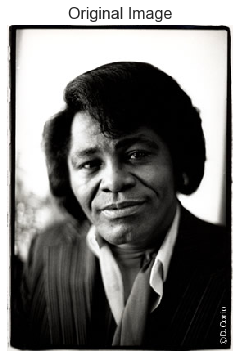

In [8]:
# Load in color image for face detection
image = cv2.imread('images/james.jpg')

# Convert the image to RGB colorspace
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Plot the RGB image
fig = plt.figure(figsize = (6,6))
ax1 = fig.add_subplot(111)
ax1.set_xticks([])
ax1.set_yticks([])

ax1.set_title('Original Image', fontsize=16)
ax1.imshow(image)

Notice that even though the image is a black and white image, we have read it in as a color image and so it will still need to be converted to grayscale in order to perform the most accurate face detection.

So, the next steps will be to convert this image to grayscale, then load OpenCV's face detector and run it with parameters that detect this face accurately.

Number of faces detected: 1


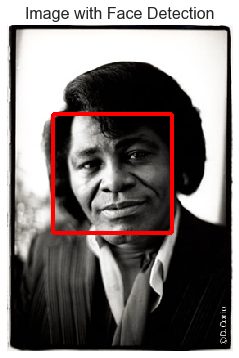

In [9]:
# Convert the RGB  image to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

# Extract the pre-trained face detector from an xml file
face_cascade = cv2.CascadeClassifier('detector_architectures/haarcascade_frontalface_default.xml')

# Detect the faces in image
faces = face_cascade.detectMultiScale(gray, 1.25, 6)

# Print the number of faces detected in the image
print('Number of faces detected:', len(faces))

# Make a copy of the orginal image to draw face detections on
image_with_detections = np.copy(image)

# Get the bounding box for each detected face
for (x,y,w,h) in faces:
    # Add a red bounding box to the detections image
    cv2.rectangle(image_with_detections, (x,y), (x+w,y+h), (255,0,0), 3)
    
# Display the image with the detections
fig = plt.figure(figsize = (6,6))
ax1 = fig.add_subplot(111)
ax1.set_xticks([])
ax1.set_yticks([])

ax1.set_title('Image with Face Detection', fontsize=16)
ax1.imshow(image_with_detections)

### (IMPLEMENTATION) Add an eye detector to the current face detection setup.  

A Haar-cascade eye detector can be included in the same way that the face detector was and, in this first task, it will be your job to do just this.


To set up an eye detector, use the stored parameters of the eye cascade detector, called ```haarcascade_eye.xml```, located in the `detector_architectures` subdirectory.  In the next code cell, create your eye detector and store its detections.

**A few notes before you get started**: 

First, make sure to give your loaded eye detector the variable name

``eye_cascade``


and give the list of eye regions you detect the variable name 

``eyes``

Second, since we've already run the face detector over this image, you should only search for eyes *within the rectangular face regions detected in ``faces``*.  This will minimize false detections.

Lastly, once you've run your eye detector over the facial detection region, you should display the RGB image with both the face detection boxes (in red) and your eye detections (in green) to verify that everything works as expected.

Number of faces detected: 1


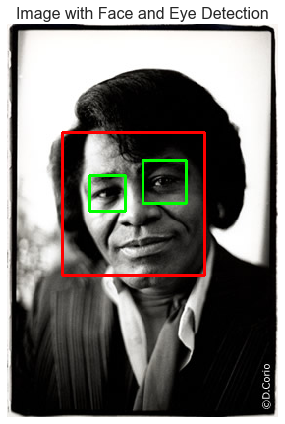

In [12]:
# Load in color image for face detection
image = cv2.imread('images/james.jpg')

# Convert the image to RGB colorspace
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Convert the RGB  image to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

# Extract the pre-trained face detector from an xml file
face_cascade = cv2.CascadeClassifier('detector_architectures/haarcascade_frontalface_default.xml')

# Detect the faces in image
faces = face_cascade.detectMultiScale(gray, 1.25, 6)

# Print the number of faces detected in the image
print('Number of faces detected:', len(faces))

# Make a copy of the orginal image to draw face detections on
image_with_detections = np.copy(image)

# Get the bounding box for each detected face
for (x,y,w,h) in faces:
    # Add a red bounding box to the detections image
    cv2.rectangle(image_with_detections, (x,y), (x+w,y+h), (255,0,0), 3)

# Make a copy of the original image to plot rectangle detections
image_with_detections = np.copy(image)   

# Loop over the detections and draw their corresponding face detection boxes
for (x,y,w,h) in faces:
    cv2.rectangle(image_with_detections, (x,y), (x+w,y+h),(255,0,0), 2)  
    
# Do not change the code above this comment!    
## TODO: Add eye detection, using haarcascade_eye.xml, to the current face detector algorithm
eye_cascade = cv2.CascadeClassifier('detector_architectures/haarcascade_eye.xml')

## TODO: Loop over the eye detections and draw their corresponding boxes in green on image_with_detections
for (x,y,w,h) in faces:
    face_grey = gray[y:y+h, x:x+w]
    face_color = image_with_detections[y:y+h, x:x+w]
    eyes = eye_cascade.detectMultiScale(face_grey)
    for (ex,ey,ew,eh) in eyes:
        cv2.rectangle(face_color,(ex,ey),(ex+ew,ey+eh),(0,255,0),2)

# Plot the image with both faces and eyes detected
fig = plt.figure(figsize = (6,6))
ax1 = fig.add_subplot(111)
ax1.set_xticks([])
ax1.set_yticks([])

ax1.set_title('Image with Face and Eye Detection', fontsize=16)
plt.tight_layout()
ax1.imshow(image_with_detections)

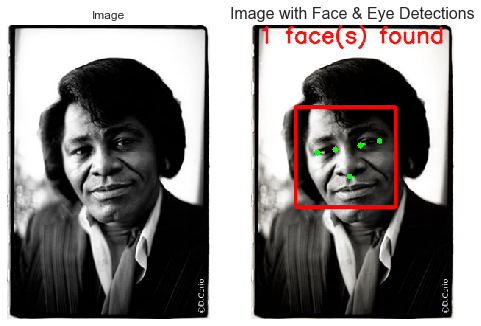

In [13]:
# TODO: #USING DLIB
%autoreload
from core.Imagetools import *

image = cv2.imread('images/james.jpg', 0)
image_with_detections = landmarksdlibcnn('images/james.jpg')

# Display the image with the detections
fig = plt.figure(figsize = (8,8))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
ax1.set_xticks([])
ax1.set_yticks([])
ax2.set_xticks([])
ax2.set_yticks([])

ax1.set_title('Image')
ax1.imshow(image, cmap='gray')
ax2.set_title('Image with Face & Eye Detections', fontsize=16)
ax2.imshow(image_with_detections, cmap='gray')
plt.show()

## (Optional) Add face and eye detection to your laptop camera

It's time to kick it up a notch, and add face and eye detection to your laptop's camera!  Afterwards, you'll be able to show off your creation like in the gif shown below - made with a completed version of the code!  

<img src="images/laptop_face_detector_example.gif" width=400 height=300/>

Notice that not all of the detections here are perfect - and your result need not be perfect either.   You should spend a small amount of time tuning the parameters of your detectors to get reasonable results, but don't hold out for perfection.  If we wanted perfection we'd need to spend a ton of time tuning the parameters of each detector, cleaning up the input image frames, etc. You can think of this as more of a rapid prototype. 

The next cell contains code for a wrapper function called ``laptop_camera_face_eye_detector`` that, when called, will activate your laptop's camera.  You will place the relevant face and eye detection code in this wrapper function to implement face/eye detection and mark those detections on each image frame that your camera captures.

Before adding anything to the function, you can run it to get an idea of how it works - a small window should pop up showing you the live feed from your camera; you can press any key to close this window.

**Note:** Mac users may find that activating this function kills the kernel of their notebook every once in a while.  If this happens to you, just restart your notebook's kernel, activate cell(s) containing any crucial import statements, and you'll be good to go!

In [14]:
### Add face and eye detection to this laptop camera function 
# Make sure to draw out all faces/eyes found in each frame on the shown video feed
import cv2
import time
%autoreload
from core.videotools import *

# wrapper function for face/eye detection with your laptop camera
def laptop_camera_go():
    # Create instance of video capturer
    cv2.namedWindow("face detection activated")
    vc = cv2.VideoCapture(0)

    # Try to get the first frame
    if vc.isOpened(): 
        rval, frame = vc.read()
    else:
        rval = False
    
    # Keep the video stream open
    while rval:
        # Plot the image from camera with all the face and eye detections marked
        frame = vidmarksdlibcnn(frame, 0)
        cv2.imshow("face detection activated", frame)
        
        # Exit functionality - press any key to exit laptop video
        key = cv2.waitKey(20)
        if key > 0: # Exit by pressing any key
            # Destroy windows
            del vc
            cv2.destroyAllWindows()
            
            # Make sure window closes on OSx
            for i in range (1,5):
                cv2.waitKey(1)
            return
        
        # Read next frame
        time.sleep(0.01) # control framerate for computation - default 20 frames per sec
        rval, frame = vc.read()    

In [ ]:
# Call the laptop camera face/eye detector function above
laptop_camera_go()

---
<a id='step2'></a>

## Step 2: De-noise an Image for Better Face Detection

Image quality is an important aspect of any computer vision task. Typically, when creating a set of images to train a deep learning network, significant care is taken to ensure that training images are free of visual noise or artifacts that hinder object detection.  While computer vision algorithms - like a face detector - are typically trained on 'nice' data such as this, new test data doesn't always look so nice!

When applying a trained computer vision algorithm to a new piece of test data one often cleans it up first before feeding it in.  This sort of cleaning - referred to as *pre-processing* - can include a number of cleaning phases like blurring, de-noising, color transformations, etc., and many of these tasks can be accomplished using OpenCV.

In this short subsection we explore OpenCV's noise-removal functionality to see how we can clean up a noisy image, which we then feed into our trained face detector.

### Create a noisy image to work with

In the next cell, we create an artificial noisy version of the previous multi-face image.  This is a little exaggerated - we don't typically get images that are this noisy - but [image noise](https://digital-photography-school.com/how-to-avoid-and-reduce-noise-in-your-images/), or 'grainy-ness' in a digitial image - is a fairly common phenomenon.

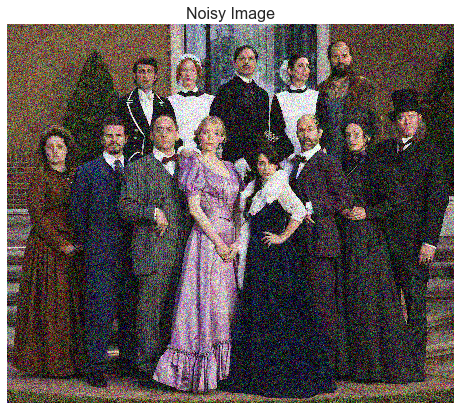

In [15]:
# Load in the multi-face test image again
image = cv2.imread('images/test_image_1.jpg')

# Convert the image copy to RGB colorspace
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Make an array copy of this image
image_with_noise = np.asarray(image)

# Create noise - here we add noise sampled randomly from a Gaussian distribution: a common model for noise
noise_level = 40
noise = np.random.randn(image.shape[0],image.shape[1],image.shape[2])*noise_level

# Add this noise to the array image copy
image_with_noise = image_with_noise + noise

# Convert back to uint8 format
image_with_noise = np.asarray([np.uint8(np.clip(i,0,255)) for i in image_with_noise])

# Plot our noisy image!
fig = plt.figure(figsize = (8,8))
ax1 = fig.add_subplot(111)
ax1.set_xticks([])
ax1.set_yticks([])

ax1.set_title('Noisy Image', fontsize=16)
ax1.imshow(image_with_noise)

In the context of face detection, the problem with an image like this is that  - due to noise - we may miss some faces or get false detections.  

In the next cell we apply the same trained OpenCV detector with the same settings as before, to see what sort of detections we get.

Number of faces detected: 13


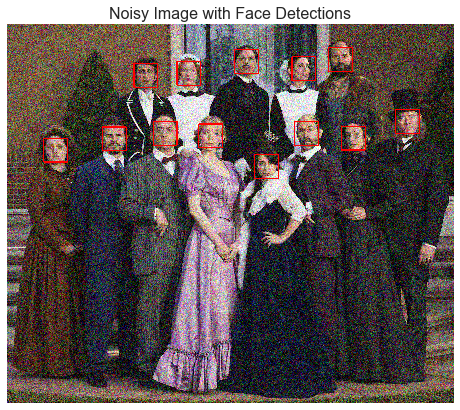

In [16]:
# Convert the RGB  image to grayscale
gray_noise = cv2.cvtColor(image_with_noise, cv2.COLOR_RGB2GRAY)

# Extract the pre-trained face detector from an xml file
face_cascade = cv2.CascadeClassifier('detector_architectures/haarcascade_frontalface_default.xml')

# Detect the faces in image
faces = face_cascade.detectMultiScale(gray_noise, 4, 6)

# Print the number of faces detected in the image
print('Number of faces detected:', len(faces))

# Make a copy of the orginal image to draw face detections on
image_with_detections = np.copy(image_with_noise)

# Get the bounding box for each detected face
for (x,y,w,h) in faces:
    # Add a red bounding box to the detections image
    cv2.rectangle(image_with_detections, (x,y), (x+w,y+h), (255,0,0), 3)
    

# Display the image with the detections
fig = plt.figure(figsize = (8,8))
ax1 = fig.add_subplot(111)
ax1.set_xticks([])
ax1.set_yticks([])

ax1.set_title('Noisy Image with Face Detections', fontsize=16)
ax1.imshow(image_with_detections)

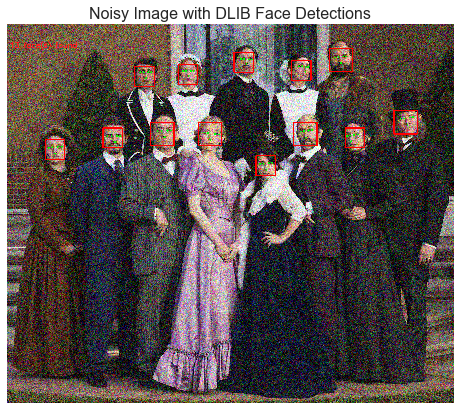

In [17]:
#TODO:
%autoreload
# Use our DLIB function to detect faces on the noisy image.
image_with_detections = ilandmarksdlibcnn(image_with_noise, 1)

# Display the image with the detections
fig = plt.figure(figsize = (8,8))
ax1 = fig.add_subplot(111)
ax1.set_xticks([])
ax1.set_yticks([])

ax1.set_title('Noisy Image with DLIB Face Detections', fontsize=16)
ax1.imshow(image_with_detections)

With this added noise we now miss one of the faces!

### (IMPLEMENTATION) De-noise this image for better face detection

Time to get your hands dirty: using OpenCV's built in color image de-noising functionality called ```fastNlMeansDenoisingColored``` - de-noise this image enough so that all the faces in the image are properly detected.  Once you have cleaned the image in the next cell, use the cell that follows to run our trained face detector over the cleaned image to check out its detections.

You can find its [official documentation here]([documentation for denoising](http://docs.opencv.org/trunk/d1/d79/group__photo__denoise.html#ga21abc1c8b0e15f78cd3eff672cb6c476) and [a useful example here](http://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_photo/py_non_local_means/py_non_local_means.html).


**Note:** you can keep all parameters *except* `photo_render` fixed as shown in the second link above.  Play around with the value of this parameter - see how it affects the resulting cleaned image.

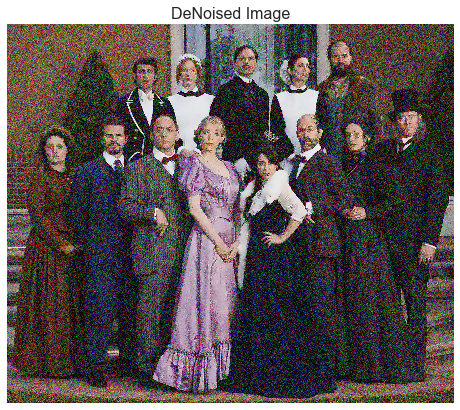

In [18]:
## Use OpenCV's built in color image de-noising function to clean up our noisy image!

image_with_noise = np.array(image_with_noise).astype(np.uint8) #8UC3
denoised_image = cv2.fastNlMeansDenoisingColored(image_with_noise,None,10,10,7,21)

# Display the image with the detections
fig = plt.figure(figsize = (8,8))
ax1 = fig.add_subplot(111)
ax1.set_xticks([])
ax1.set_yticks([])

ax1.set_title('DeNoised Image', fontsize=16)
ax1.imshow(denoised_image)

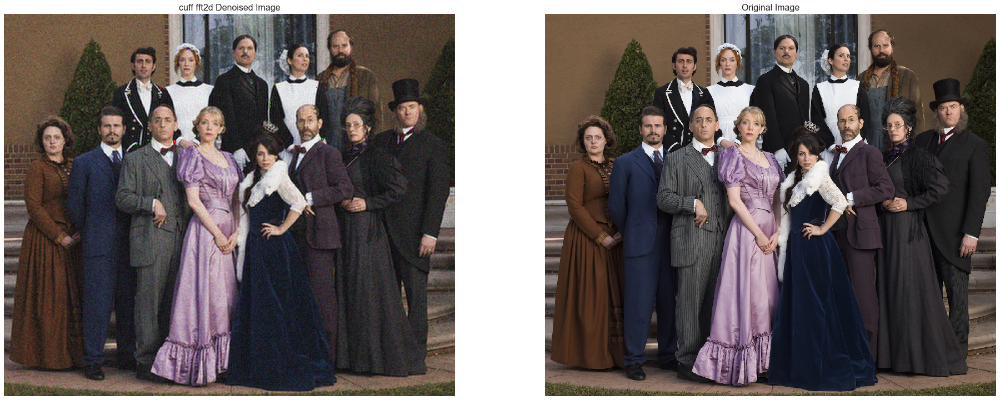

In [19]:
## FFT2 denoising with cupy/cuda cufft
%autoreload

from core.denoise import *
image_with_noise = np.array(image_with_noise).astype(np.uint8) #8UC3
denoised_image = rgb_denoise(image_with_noise,keep_frac=0.1,passes=1)

# Display the image with the detections
fig = plt.figure(figsize = (32,32))
ax1 = fig.add_subplot(221)
ax1.set_xticks([])
ax1.set_yticks([])

ax1.set_title('cuff fft2d Denoised Image', fontsize=16)
ax1.imshow(denoised_image)

ax1 = fig.add_subplot(222)
ax1.set_xticks([])
ax1.set_yticks([])

ax1.set_title('Original Image', fontsize=16)
ax1.imshow(image)

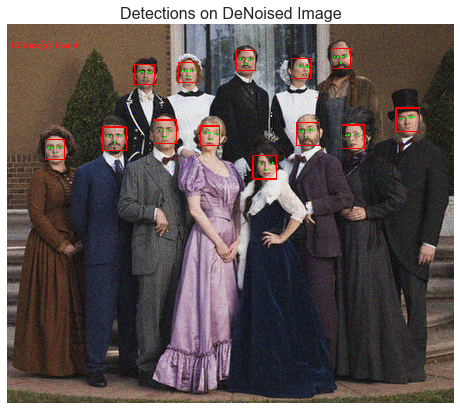

In [20]:
## Run the face detector on the de-noised image to improve your detections and display the result
%autoreload
img_with_detections = ilandmarksdlibcnn(denoised_image,1)

# Display the image with the detections
fig = plt.figure(figsize = (8,8))
ax1 = fig.add_subplot(111)
ax1.set_xticks([])
ax1.set_yticks([])

ax1.set_title('Detections on DeNoised Image', fontsize=16)
ax1.imshow(img_with_detections)

---
<a id='step3'></a>

## Step 3: Blur an Image and Perform Edge Detection

Now that we have developed a simple pipeline for detecting faces using OpenCV - let's start playing around with a few fun things we can do with all those detected faces!

### Importance of Blur in Edge Detection

Edge detection is a concept that pops up almost everywhere in computer vision applications, as edge-based features (as well as features built on top of edges) are often some of the best features for e.g., object detection and recognition problems.

Edge detection is a dimension reduction technique - by keeping only the edges of an image we get to throw away a lot of non-discriminating information.  And typically the most useful kind of edge-detection is one that preserves only the important, global structures (ignoring local structures that aren't very discriminative).  So removing local structures / retaining global structures is a crucial pre-processing step to performing edge detection in an image, and blurring can do just that.  

Below is an animated gif showing the result of an edge-detected cat [taken from Wikipedia](https://en.wikipedia.org/wiki/Gaussian_blur#Common_uses), where the image is gradually blurred more and more prior to edge detection.  When the animation begins you can't quite make out what it's a picture of, but as the animation evolves and local structures are removed via blurring the cat becomes visible in the edge-detected image.

<img src="images/Edge_Image.gif" width=400 height=300/>

Edge detection is a **convolution** performed on the image itself, and you can read about Canny edge detection on [this OpenCV documentation page](http://docs.opencv.org/2.4/doc/tutorials/imgproc/imgtrans/canny_detector/canny_detector.html).

### Canny edge detection

In the cell below we load in a test image, then apply *Canny edge detection* on it.  The original image is shown on the left panel of the figure, while the edge-detected version of the image is shown on the right.  Notice how the result looks very busy - there are too many little details preserved in the image before it is sent to the edge detector.  When applied in computer vision applications, edge detection should preserve *global* structure; doing away with local structures that don't help describe what objects are in the image.

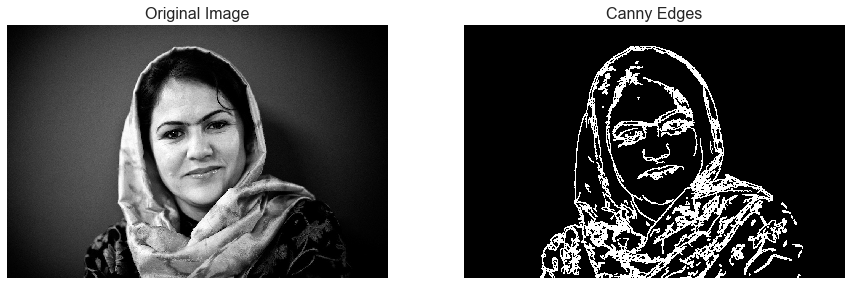

In [21]:
# Load in the image
image = cv2.imread('images/fawzia.jpg')

# Convert to RGB colorspace
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)  

# Perform Canny edge detection
edges = cv2.Canny(gray,100,200)

# Dilate the image to amplify edges

kernel = np.ones((3,3),np.float32)/21
edges = cv2.dilate(edges, kernel, iterations=1)

# Plot the RGB and edge-detected image
fig = plt.figure(figsize = (15,15))
ax1 = fig.add_subplot(121)
ax1.set_xticks([])
ax1.set_yticks([])

ax1.set_title('Original Image', fontsize=16)
ax1.imshow(image)

ax2 = fig.add_subplot(122)
ax2.set_xticks([])
ax2.set_yticks([])

ax2.set_title('Canny Edges', fontsize=16)
ax2.imshow(edges, cmap='gray')

Without first blurring the image, and removing small, local structures, a lot of irrelevant edge content gets picked up and amplified by the detector (as shown in the right panel above). 

### (IMPLEMENTATION) Blur the image *then* perform edge detection

In the next cell, you will repeat this experiment - blurring the image first to remove these local structures, so that only the important boudnary details remain in the edge-detected image.

Blur the image by using OpenCV's ```filter2d``` functionality - which is discussed in [this documentation page](http://docs.opencv.org/3.1.0/d4/d13/tutorial_py_filtering.html) - and use an *averaging kernel* of width equal to 4.

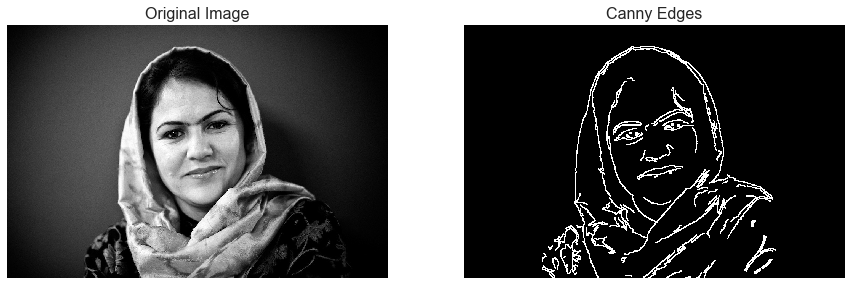

In [22]:
### Blur the test imageusing OpenCV's filter2d functionality, 
# Use an averaging kernel, and a kernel width equal to 4
image = cv2.imread('images/fawzia.jpg')
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

# do box filter blur
kernel = np.ones((4,4),np.float32)/15
blurred = cv2.filter2D(gray, -1, kernel)

# canny edge
edges = cv2.Canny(blurred,100,200)
edges = cv2.dilate(edges, kernel[:3,:3])

## Then perform Canny edge detection and display the output
# Plot the RGB and edge-detected image
fig = plt.figure(figsize = (15,15))
ax1 = fig.add_subplot(121)
ax1.set_xticks([])
ax1.set_yticks([])

ax1.set_title('Original Image', fontsize=16)
ax1.imshow(image)

ax2 = fig.add_subplot(122)
ax2.set_xticks([])
ax2.set_yticks([])

ax2.set_title('Canny Edges', fontsize=16)
ax2.imshow(edges, cmap='gray')

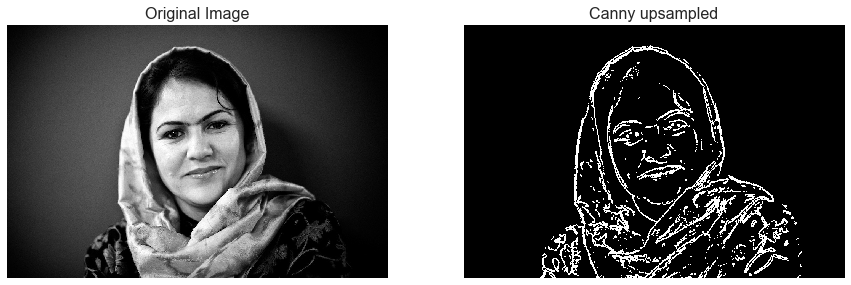

In [23]:
### Blur the test imageusing OpenCV's filter2d functionality, 
# Use an averaging kernel, and a kernel width equal to 4
%autoreload
from core.Imagetools import *
from core.denoise import *

gray = cv2.imread('images/fawzia.jpg',0)

cannyimage = detectedgescv_gray(gray)

## Then perform Canny edge detection and display the output
# Plot the RGB and edge-detected image
fig = plt.figure(figsize = (15,15))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)

ax1.set_xticks([])
ax1.set_yticks([])
ax1.set_title('Original Image', fontsize=16)
ax1.imshow(gray, cmap='gray')

ax2.set_xticks([])
ax2.set_yticks([])
ax2.set_title('Canny upsampled', fontsize=16)
ax2.imshow(cannyimage, cmap='gray')

## ---
<a id='step4'></a>

## Step 4: Automatically Hide the Identity of an Individual

If you film something like a documentary or reality TV, you must get permission from every individual shown on film before you can show their face, otherwise you need to blur it out - by blurring the face a lot (so much so that even the global structures are obscured)!  This is also true for projects like [Google's StreetView maps](https://www.google.com/streetview/) - an enormous collection of mapping images taken from a fleet of Google vehicles.  Because it would be impossible for Google to get the permission of every single person accidentally captured in one of these images they blur out everyone's faces, the detected images must automatically blur the identity of detected people.  Here's a few examples of folks caught in the camera of a Google street view vehicle.

<img src="images/streetview_example_1.jpg" width=400 height=300/>
<img src="images/streetview_example_2.jpg" width=400 height=300/>


### Read in an image to perform identity detection

Let's try this out for ourselves.  Use the face detection pipeline built above and what you know about using the ```filter2D``` to blur and image, and use these in tandem to hide the identity of the person in the following image - loaded in and printed in the next cell. 

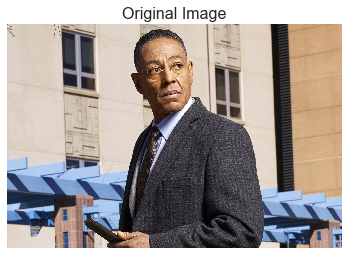

In [24]:
# Load in the image
image = cv2.imread('images/gus.jpg')

# Convert the image to RGB colorspace
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Display the image
fig = plt.figure(figsize = (6,6))
ax1 = fig.add_subplot(111)
ax1.set_xticks([])
ax1.set_yticks([])
ax1.set_title('Original Image', fontsize=16)
ax1.imshow(image)

### (IMPLEMENTATION) Use blurring to hide the identity of an individual in an image

The idea here is to 1) automatically detect the face in this image, and then 2) blur it out!  Make sure to adjust the parameters of the *averaging* blur filter to completely obscure this person's identity.

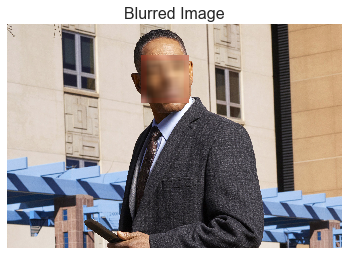

In [25]:
## Implement face detection
%autoreload
from core.Imagetools import *
## Blur the bounding box around each detected face using an averaging filter and display the result
gusimage = blurfaces('images/gus.jpg')

# Display the image
fig = plt.figure(figsize = (6,6))
ax1 = fig.add_subplot(111)
ax1.set_xticks([])
ax1.set_yticks([])
ax1.set_title('Blurred Image', fontsize=16)
ax1.imshow((gusimage))

### (Optional) Build identity protection into your laptop camera

In this optional task you can add identity protection to your laptop camera, using the previously completed code where you added face detection to your laptop camera - and the task above.  You should be able to get reasonable results with little parameter tuning - like the one shown in the gif below.

<img src="images/laptop_blurer_example.gif" width=400 height=300/>

As with the previous video task, to make this perfect would require significant effort - so don't strive for perfection here, strive for reasonable quality.  

The next cell contains code a wrapper function called ``laptop_camera_identity_hider`` that - when called  - will activate your laptop's camera.  You need to place the relevant face detection and blurring code developed above in this function in order to blur faces entering your laptop camera's field of view.

Before adding anything to the function you can call it to get a hang of how it works - a small window will pop up showing you the live feed from your camera, you can press any key to close this window.

**Note:** Mac users may find that activating this function kills the kernel of their notebook every once in a while.  If this happens to you, just restart your notebook's kernel, activate cell(s) containing any crucial import statements, and you'll be good to go!

In [26]:
### Insert face detection and blurring code into the wrapper below to create an identity protector on your laptop!
%autoreload
from core.videotools import *
import cv2
import time 

def laptop_camera_go():
    # Create instance of video capturer
    cv2.namedWindow("face detection activated")
    vc = cv2.VideoCapture(0)

    # Try to get the first frame
    if vc.isOpened(): 
        rval, frame = vc.read()
    else:
        rval = False
    
    # Keep video stream open
    while rval:
        # Plot image from camera with detections marked
        frame = vidblurfaces(frame)
        cv2.imshow("face detection activated", frame)
        
        # Exit functionality - press any key to exit laptop video
        key = cv2.waitKey(20)
        if key > 0: # Exit by pressing any key
            # Destroy windows
            cv2.destroyAllWindows()
            
            for i in range (1,5):
                cv2.waitKey(1)
            return
        
        # Read next frame
        time.sleep(0.05)             # control framerate for computation - default 20 frames per sec
        rval, frame = vc.read()    
        

In [ ]:
# Run laptop identity hider
laptop_camera_go()

---
<a id='step5'></a>

## Step 5: Create a CNN to Recognize Facial Keypoints

OpenCV is often used in practice with other machine learning and deep learning libraries to produce interesting results.  In this stage of the project you will create your own end-to-end pipeline - employing convolutional networks in keras along with OpenCV - to apply a "selfie" filter to streaming video and images.  

You will start by creating and then training a convolutional network that can detect facial keypoints in a small dataset of cropped images of human faces.  We then guide you towards OpenCV to expanding your detection algorithm to more general images.  What are facial keypoints?  Let's take a look at some examples.

<img src="images/keypoints_test_results.png" width=400 height=300/>

Facial keypoints (also called facial landmarks) are the small blue-green dots shown on each of the faces in the image above - there are 15 keypoints marked in each image.  They mark important areas of the face - the eyes, corners of the mouth, the nose, etc.  Facial keypoints can be used in a variety of machine learning applications from face and emotion recognition to commercial applications like the image filters popularized by Snapchat.

Below we illustrate a filter that, using the results of this section, automatically places sunglasses on people in images (using the facial keypoints to place the glasses correctly on each face).  Here, the facial keypoints have been colored lime green for visualization purposes.

<img src="images/obamas_with_shades.png" width=1000 height=1000/>

### Make a facial keypoint detector

But first things first: how can we make a facial keypoint detector?  Well, at a high level, notice that facial keypoint detection is a *regression problem*.  A single face corresponds to a set of 15 facial keypoints (a set of 15 corresponding $(x, y)$ coordinates, i.e., an output point).  Because our input data are images, we can employ a *convolutional neural network* to recognize patterns in our images and learn how to identify these keypoint given sets of labeled data.

In order to train a regressor, we need a training set - a set of facial image / facial keypoint pairs to train on.  For this we will be using [this dataset from Kaggle](https://www.kaggle.com/c/facial-keypoints-detection/data). We've already downloaded this data and placed it in the `data` directory. Make sure that you have both the *training* and *test* data files.  The training dataset contains several thousand $96 \times 96$ grayscale images of cropped human faces, along with each face's 15 corresponding facial keypoints (also called landmarks) that have been placed by hand, and recorded in $(x, y)$ coordinates.  This wonderful resource also has a substantial testing set, which we will use in tinkering with our convolutional network.

To load in this data, run the Python cell below - notice we will load in both the training and testing sets.

The `load_data` function is in the included `utils.py` file.

In [ ]:
from utils import *

# Load training set
X_train, y_train = load_data()
print("X_train.shape == {}".format(X_train.shape))
print("y_train.shape == {}; y_train.min == {:.3f}; y_train.max == {:.3f}".format(
    y_train.shape, y_train.min(), y_train.max()))

# Load testing set
X_test, _ = load_data(test=True)
print("X_test.shape == {}".format(X_test.shape))
print("Y_test.shape == {}".format(_))

# save
import io
import pickle

with open('data/cnndata/cnn_train_test_data.npy','wb') as file:
    pickle.dump(file=file, obj={'train':[X_train, y_train],'test':[X_test,_]},protocol=4)
    file.close()

In [14]:
# Import required libraries for this section
from functools import partial
import numpy as np
import matplotlib.pyplot as plt
import math
import cv2                     # OpenCV library for computer vision
from PIL import Image
import matplotlib as mpl
import pickle
import time
from joblib import Parallel, delayed
import gc
import tensorflow as tf

%matplotlib inline

%load_ext cython
%load_ext line_profiler
%load_ext autoreload


%autoreload
from core.Imagetools import *
plt.style.use('fivethirtyeight')

The cython extension is already loaded. To reload it, use:
  %reload_ext cython
The line_profiler extension is already loaded. To reload it, use:
  %reload_ext line_profiler
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [15]:
# reload data
from utils import *

def traindata():
    
    with open('data/cnndata/cnn_train_test_data.npy','rb') as file:
        npload = np.load(file,allow_pickle=True)
    
    x_train, y_train = npload['train']
    
    print('Full Trainset X Shape: {}'.format(x_train.shape))
    print('Full Trainset Y Shape: {}'.format(y_train.shape))        
    
    return x_train, y_train

xtrain, ytrain = traindata()

#load test set
with open('data/cnndata/cnn_train_test_data.npy','rb') as file:
    npload = np.load(file,allow_pickle=True)
    
    X_test, _ = npload['test']

Full Trainset X Shape: (2140, 96, 96, 1)
Full Trainset Y Shape: (2140, 30)


The `load_data` function in `utils.py` originates from this excellent [blog post](http://danielnouri.org/notes/2014/12/17/using-convolutional-neural-nets-to-detect-facial-keypoints-tutorial/), which you are *strongly* encouraged to read.  Please take the time now to review this function.  Note how the output values - that is, the coordinates of each set of facial landmarks - have been normalized to take on values in the range $[-1, 1]$, while the pixel values of each input point (a facial image) have been normalized to the range $[0,1]$.  

Note: the original Kaggle dataset contains some images with several missing keypoints.  For simplicity, the `load_data` function removes those images with missing labels from the dataset.  As an __*optional*__ extension, you are welcome to amend the `load_data` function to include the incomplete data points. 

### Visualize the Training Data

Execute the code cell below to visualize a subset of the training data.

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

fig = plt.figure(figsize=(8,8))
fig.subplots_adjust(left=0, right=1, bottom=0, top=1, hspace=0.05, wspace=0.05)

for i in range(9):
    ax = fig.add_subplot(3, 3, i + 1, xticks=[], yticks=[])
    plot_data(xtrain[i], ytrain[i], ax)

In [ ]:

def horizflipimg(ximg):
    
    image = ximg.reshape(96,96)
    image = cv2.flip(image, 1)
    image = np.expand_dims(image, axis=-1)
    return image

def horizflipval(trueval):
    
    trueval[::2] = -trueval[::2]
    return trueval

def faugment(xset, yset):
    
    numimgs = xset.shape[0]
    with Parallel(n_jobs=8) as parallel:
        
        resx = parallel(delayed(horizflipimg)(xset[i]) 
                        for i in range(numimgs))
        resy = parallel(delayed(horizflipval)(yset[i]) 
                        for i in range(numimgs))
        
        resx = np.array([res for res in resx])
        resy = np.array([res for res in resy])
        
    return resx, resy

flippedx, flippedy = faugment(xtrain[123:132], ytrain[123:132])

numimgs = 9

fig = plt.figure(figsize=(8,8))
plt.title('Horizontal Flipping, Transformed Set of {}'.format(numimgs))
fig.subplots_adjust(left=0, right=1, bottom=0, top=1, hspace=0.05, wspace=0.05)

for i in range(numimgs):
    ax = fig.add_subplot(3, 3, i + 1, xticks=[], yticks=[])
    plot_data(flippedx[i], flippedy[i], ax)

In [ ]:
def rotateimg(ximg, degrees=15):
    
    image = ximg.reshape(96,96)
    rows,cols = image.shape
    
    rot_MAT = cv2.getRotationMatrix2D((cols/2,rows/2), degrees, 1)
    image = cv2.warpAffine(image, rot_MAT, (cols,rows),
                           flags=cv2.INTER_CUBIC, 
                           borderMode=cv2.BORDER_REFLECT101)
    
    image = np.expand_dims(image, axis=-1)
    return image

def rotateby(trueval, degrees=15):
    
    rads = -np.radians(degrees)
    
    newxval = trueval[::2]
    newyval = trueval[1::2]
    final = np.zeros((30))
    
    newxval = np.array(newxval)
    newyval = np.array(newyval)
    
    npsinx = (newxval)*np.sin(rads)
    npcosx = (newxval)*np.cos(rads)
    npsiny = (newyval)*np.sin(rads)
    npcosy = (newyval)*np.cos(rads)
    
    newxval, newyval = npcosx-npsiny, npsinx+npcosy

    final[::2] = (newxval)
    final[1::2] = (newyval)
    
    return final.reshape(30)

def raugment(xset, yset):
    
    numimgs = xset.shape[0]
    with Parallel(n_jobs=8) as parallel:
        
        resx = parallel(delayed(rotateimg)(xset[i]) 
                        for i in range(numimgs))
        resy = parallel(delayed(rotateby)(yset[i]) 
                        for i in range(numimgs))
        
        resx = np.array([res for res in resx])
        resy = np.array([res for res in resy])
        
    return resx, resy

flippedx, flippedy = raugment(xtrain[:9], ytrain[:9])

numimgs = 9

fig = plt.figure(figsize=(8,8))
plt.title('Rotating, Transformed Set of {}'.format(numimgs))
fig.subplots_adjust(left=0, right=1, bottom=0, top=1, hspace=0.05, wspace=0.05)

for i in range(numimgs):
    ax = fig.add_subplot(3, 3, i + 1, xticks=[], yticks=[])
    plot_data(flippedx[i], flippedy[i], ax)

In [ ]:
def augment(xset, yset):
    
    numimgs = xset.shape[0]
    with Parallel(n_jobs=8) as parallel:
        
        randshifts = np.random.randint(15, 30, size=numimgs)
        
        rotx = parallel(delayed(rotateimg)(xset[i],randshifts[i]) 
                        for i in range(numimgs))
        roty = parallel(delayed(rotateby)(yset[i],randshifts[i]) 
                        for i in range(numimgs))
        flipx = parallel(delayed(horizflipimg)(xset[i]) 
                        for i in range(numimgs))
        flipy = parallel(delayed(horizflipval)(yset[i]) 
                        for i in range(numimgs))
        
        # not using rotated images, leads to weird results
        
        resx = np.array([res for res in flipx+rotx])
        resy = np.array([np.array(res) for res in flipy+roty])
        
    return resx, resy

flippedx, flippedy = augment(xtrain[:1712], ytrain[:1712])

flippedx.shape, flippedy.shape

In [ ]:
mask = sorted([np.random.randint(0,len(flippedx)) for x in range(len(flippedx)//4)])
subx, suby = flippedx[mask], flippedy[mask]
subx.shape, suby.shape

In [ ]:
xvalid, yvalid = xtrain[1712:], ytrain[1712:]
augtrain = np.vstack([xtrain[:1712],subx])
augtruth = np.vstack([ytrain[:1712],suby])


fig = plt.figure(figsize=(8,8))
plt.title('Transformed Set of {}'.format(numimgs))
fig.subplots_adjust(left=0, right=1, bottom=0, top=1, hspace=0.05, wspace=0.05)

for i in range(numimgs):
    ix = np.random.randint(1, 2568)
    ax = fig.add_subplot(3, 3, i + 1, xticks=[], yticks=[])
    plot_data(augtrain[ix], augtruth[ix], ax)

For each training image, there are two landmarks per eyebrow (**four** total), three per eye (**six** total), **four** for the mouth, and **one** for the tip of the nose.  

Review the `plot_data` function in `utils.py` to understand how the 30-dimensional training labels in `y_train` are mapped to facial locations, as this function will prove useful for your pipeline.

### (IMPLEMENTATION) Specify the CNN Architecture

In this section, you will specify a neural network for predicting the locations of facial keypoints.  Use the code cell below to specify the architecture of your neural network.  We have imported some layers that you may find useful for this task, but if you need to use more Keras layers, feel free to import them in the cell.

Your network should accept a $96 \times 96$ grayscale image as input, and it should output a vector with 30 entries, corresponding to the predicted (horizontal and vertical) locations of 15 facial keypoints.  If you are not sure where to start, you can find some useful starting architectures in [this blog](http://danielnouri.org/notes/2014/12/17/using-convolutional-neural-nets-to-detect-facial-keypoints-tutorial/), but you are not permitted to copy any of the architectures that you find online.

In [2]:
# Import deep learning resources from Keras
from keras import Model
from functools import partial
from keras.models import *
from keras.layers import *
from keras.layers import Flatten, Dense
from keras import backend as K
from keras.optimizers import *
from keras.callbacks import *
from keras.initializers import *
from keras.activations import *
from keras.losses import *
from keras.metrics import *
from keras.utils import np_utils

import keras.backend.tensorflow_backend as K
import tensorflow as tf


# SGD, RMSprop, Adagrad, Adadelta, Adam, Adamax, Nadam

# Since both TF/MX and DLIB-CNN are using the same GPU, 
# we need to be more explicit with how the the memory is allocated,
# especially because TF doesn't want to let go of the memory.

def makesession():
    K.get_session().close()
    cfg = K.tf.ConfigProto()
    cfg.gpu_options.allow_growth = True
    K.set_session(K.tf.Session(config=cfg))
    
makesession()

Using TensorFlow backend.


In [3]:
from keras.losses import *

def root_mean_squared_error(y_true, y_pred):
        return K.sqrt(K.mean(K.square(y_pred - y_true), axis=-1))

In [4]:
def facekey_net_small(nb_classes,
                batchinputshape=(None, 96, 96, 1),
                shortreturn=False, prefix=''):
    seed = 42
    
    r_init = lecun_uniform(seed=seed)
    bnorm = partial(BatchNormalization, axis=-1)
    
    renm = lambda x, y: str(y)+str(x)
    
    # using elu/selu/tanh to avoid gradient scaling issues with adamax
    conv2d = partial(Convolution2D, activation='selu',
                kernel_initializer=glorot_normal(seed=seed),
                data_format="channels_last",
                padding='same')

    
    avpool2d = partial(AveragePooling2D, padding='same',
                     data_format='channels_last')
    
    maxpool2d = partial(MaxPooling2D, padding='same',
                         data_format='channels_last')
    
    # define model
    #input_img = to_channels_first(input_img)
    
    input_img = Input(shape=batchinputshape[1:], dtype='float32')
    
    bnorm0 = bnorm(name='bnorm_0')(input_img)    
    convi = conv2d(16, (7, 7), strides=(1, 1),
                   name=renm('conv_in_0', prefix))(bnorm0)
    convi = bnorm(name='bnorm_i0')(convi)
    
    
    convi = conv2d(32, (5, 5), strides=(1, 1),
                   name=renm('conv_in_1', prefix))(convi)
    convi = conv2d(64, (5, 5), strides=(1, 1),
                   name=renm('conv_in_2', prefix))(convi)
    maxpool_0 = maxpool2d(pool_size=(5,5), strides=(5,5),
                      name=renm('maxpool_0', prefix))(convi)    
    
    conv_f = conv2d(64, (1, 1), strides=(1, 1),
                   name=renm('convf_0', prefix))(maxpool_0)
    conv_f = conv2d(32, (5, 5), strides=(1, 1),
                   name=renm('convf_1', prefix))(conv_f)
    gap_f = GlobalAveragePooling2D()(conv_f)
    
    
    dense_0 = Dense(units=120, activation='elu', 
                  kernel_initializer=r_init, 
                  name=renm('dense_0', prefix))(gap_f)
    drop_0 = Dropout(0.25, name=renm('drop_0', prefix))(dense_0)
    
    
    dense_1 = Dense(units=60, activation='selu', 
                  kernel_initializer=r_init, 
                  name=renm('dense_1', prefix))(drop_0)
    drop_1 = Dropout(0.125, name=renm('drop_1', prefix))(dense_1)
    
    
    preds = Dense(units=nb_classes, activation='linear', 
                  kernel_initializer=r_init, 
                  name=renm('preds_final', prefix))(drop_1)
    
    if shortreturn==True:
        return input_img, preds
    else:
        fmodel = Model(inputs=input_img, outputs=preds)
        return fmodel

facekey_net_small(30).summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 96, 96, 1)         0         
_________________________________________________________________
bnorm_0 (BatchNormalization) (None, 96, 96, 1)         4         
_________________________________________________________________
conv_in_0 (Conv2D)           (None, 96, 96, 16)        800       
_________________________________________________________________
bnorm_i0 (BatchNormalization (None, 96, 96, 16)        64        
_________________________________________________________________
conv_in_1 (Conv2D)           (None, 96, 96, 32)        12832     
_________________________________________________________________
conv_in_2 (Conv2D)           (None, 96, 96, 64)        51264     
_________________________________________________________________
maxpool_0 (MaxPooling2D)     (None, 20, 20, 64)        0         
__________

In [5]:
def facekey_net(nb_classes,
                batchinputshape=(None, 96, 96, 1),
                shortreturn=False, prefix=''):
    
    seed = 42
    
    r_init = lecun_uniform(seed=seed)
    bnorm = partial(BatchNormalization, axis=-1)
    
    renm = lambda x, y: str(y)+str(x)
    
    # using elu/selu/tanh to avoid gradient scaling issues with adamax
    conv2d = partial(Convolution2D, activation='selu',
                kernel_initializer=glorot_normal(seed=seed),
                data_format="channels_last",
                padding='same')

    
    avpool2d = partial(AveragePooling2D, padding='same',
                     data_format='channels_last')
    
    maxpool2d = partial(MaxPooling2D, padding='same',
                         data_format='channels_last')
    
    # define model
    #input_img = to_channels_first(input_img)
    
    input_img = Input(shape=batchinputshape[1:], dtype='float32')
    
    bnorm0 = bnorm(name='bnorm_0')(input_img)  
    
    convi = conv2d(32, (5, 5), strides=(1, 1),
                   name=renm('conv_in', prefix))(bnorm0)
    convi = bnorm(name='bnorm_i_0')(convi)
    
    
    
    conv0 = conv2d(64, (5, 5), strides=(1, 1),
                   name=renm('conv0_1', prefix))(convi)
    conv0 = bnorm(name='bnorm_0_0')(conv0)
    
    conv0 = conv2d(128, (5, 5), strides=(1, 1),
                   name=renm('conv0_2', prefix))(conv0)
    conv0 = bnorm(name='bnorm_0_1')(conv0)
    
    maxpool_0 = maxpool2d(pool_size=(3,3), strides=(3,3),
                      name=renm('maxpool_0', prefix))(conv0)
    
    
    conv_f = conv2d(128, (1, 1), strides=(1, 1),
                   name=renm('convf_0', prefix))(maxpool_0)
    conv_f = bnorm(name='bnorm_f_0')(conv_f)
    
    conv_f = conv2d(256, (5, 5), strides=(1, 1),
                   name=renm('convf_1', prefix))(conv_f)
    conv_f = bnorm(name='bnorm_f_1')(conv_f)
    
    gap = GlobalMaxPool2D(name='pool_global_0',
                          data_format='channels_first')(conv_f)   
    
    
    dense_0 = Dense(units=256, activation='selu', 
                  kernel_initializer=r_init, 
                  name=renm('dense_0', prefix))(gap)
    
    drop_0 = Dropout(0.01, name=renm('drop_0', prefix))(dense_0)
    
    dense_1 = Dense(units=128, activation='selu', 
                  kernel_initializer=r_init, 
                  name=renm('dense_1', prefix))(drop_0)
    
    drop_1 = Dropout(0.01, name=renm('drop_1', prefix))(dense_1)
   
    
    preds = Dense(units=nb_classes, activation='linear', 
                  kernel_initializer=r_init, 
                  name=renm('preds_final', prefix))(drop_1)
    
    if shortreturn==True:
        return input_img, preds
    else:
        fmodel = Model(inputs=input_img, outputs=preds)
        return fmodel
    
facekey_net(30).summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 96, 96, 1)         0         
_________________________________________________________________
bnorm_0 (BatchNormalization) (None, 96, 96, 1)         4         
_________________________________________________________________
conv_in (Conv2D)             (None, 96, 96, 32)        832       
_________________________________________________________________
bnorm_i_0 (BatchNormalizatio (None, 96, 96, 32)        128       
_________________________________________________________________
conv0_1 (Conv2D)             (None, 96, 96, 64)        51264     
_________________________________________________________________
bnorm_0_0 (BatchNormalizatio (None, 96, 96, 64)        256       
_________________________________________________________________
conv0_2 (Conv2D)             (None, 96, 96, 128)       204928    
__________

---
<a id='step6'></a>

## Step 6: Compile and Train the Model

After specifying your architecture, you'll need to compile and train the model to detect facial keypoints'

### (IMPLEMENTATION) Compile and Train the Model

Use the `compile` [method](https://keras.io/models/sequential/#sequential-model-methods) to configure the learning process.  Experiment with your choice of [optimizer](https://keras.io/optimizers/); you may have some ideas about which will work best (`SGD` vs. `RMSprop`, etc), but take the time to empirically verify your theories.

Use the `fit` [method](https://keras.io/models/sequential/#sequential-model-methods) to train the model.  Break off a validation set by setting `validation_split=0.2`.  Save the returned `History` object in the `history` variable.  

Experiment with your model to minimize the validation loss (measured as mean squared error). A very good model will achieve about 0.0015 loss (though it's possible to do even better).  When you have finished training, [save your model](https://keras.io/getting-started/faq/#how-can-i-save-a-keras-model) as an HDF5 file with file path `my_model.h5`.

In [6]:
# SGD, RMSprop, Adagrad, Adadelta, Adam, Adamax, Nadam

BATCH_SIZE = 32

sgd = SGD(lr=0.001,momentum=0.9,decay=1e-6,nesterov=True)

adam = Adam(lr=0.001)

rmsprop = RMSprop(lr=0.001)

adagrad = Adagrad(lr=0.001)

adadelta = Adadelta(lr=0.001)

adamax = Adamax(lr=0.001)

nadam = Nadam(lr=0.001)

optidict = {'sgd':sgd,
           'adam':adam,
           'rmsprop':rmsprop,
           'adagrad':adagrad,
           'adadelta':adadelta,
           'adamax':adamax,
           'nadam':nadam}

optidict['nadam']

In [7]:
from keras_tqdm import TQDMNotebookCallback

lrop = ReduceLROnPlateau(monitor='mean_squared_error', 
                         factor=np.sqrt(0.1),
                         patience=5, verbose=1,
                         mode='min', cooldown=0,
                         min_delta=1e-6, 
                         min_lr=0.5e-6)

earlystop = EarlyStopping(monitor='mean_squared_error', min_delta=1e-6,
                          patience=25, verbose=1, mode='min')

chkptsave = partial(ModelCheckpoint, monitor='mean_squared_error',
                             verbose=1, save_best_only=True)

kerasnbtqdm = TQDMNotebookCallback()

### Optimizer Selection

In [8]:
def runmodelsfn(optimizer: str,
                model: object,
                putstr: str='facekey',
                epochs: int=60,
                batch_size: int=16):
    
    #defns for modelruns
    
    BATCH_SIZE = batch_size

    sgd = SGD(lr=0.001, momentum=0.9, nesterov=True)

    adam = Adam(lr=0.001)

    rmsprop = RMSprop(lr=0.001)

    adagrad = Adagrad(lr=0.001)

    adadelta = Adadelta(lr=0.001)

    adamax = Adamax(lr=0.001)

    nadam = Nadam(lr=0.001)

    r_optidict = {'sgd':sgd, 'adam':adam, 'nadam':nadam, 'rmsprop':rmsprop,
                  'adagrad':adagrad, 'adadelta':adadelta, 'adamax':adamax,}
    #data
    xvalid, yvalid = xtrain[1712:], ytrain[1712:]
    
    #saves
    bestweights = 'data/modelsaves/facekeypoints_{0}_{1}_best_model_weights.h5'
    best_model = bestweights.format(optimizer, putstr)
    lastweights = 'data/modelsaves/optiruns/facekeypoints_{}_{}_final_model.h5'
    final_model = lastweights.format(optimizer, putstr)
    

    #callbacks    
    mcallbacks = [kerasnbtqdm, lrop, earlystop, chkptsave(best_model)]
    
    ## compile
    model.compile(optimizer=r_optidict[optimizer], 
                  loss=root_mean_squared_error, 
                  metrics=['accuracy','mean_squared_error'])
    
    ## train
    modelhist = model.fit(augtrain[:1712:1], augtruth[:1712:1],
                          batch_size=BATCH_SIZE,
                          epochs=epochs,verbose=0, 
                          callbacks=mcallbacks, 
                          validation_data=(xvalid,yvalid), 
                          shuffle=True)

        
    ## save model
    print('saving model to ',final_model,' ....')
    model.save(final_model)
    return modelhist.history

In [24]:
BATCH_SIZE = 32
# run all models

resdictlite = {mkey:runmodelsfn(mkey,
                                model=facekey_net_small(30),
                                putstr='facekey_small',
                                batch_size=BATCH_SIZE,
                                epochs=15) for mkey in sorted(optidict.keys())}

#save resdict:
with open('data/optiruns_history_alloptimizers_small.npy','wb') as file:
    pickle.dump(file=file, obj=resdictlite,protocol=4)
    file.close()


Epoch 00001: mean_squared_error improved from inf to 0.71474, saving model to data/modelsaves/facekeypoints_adadelta_facekey_small_best_model_weights.h5



Epoch 00002: mean_squared_error improved from 0.71474 to 0.56977, saving model to data/modelsaves/facekeypoints_adadelta_facekey_small_best_model_weights.h5



Epoch 00003: mean_squared_error improved from 0.56977 to 0.43405, saving model to data/modelsaves/facekeypoints_adadelta_facekey_small_best_model_weights.h5



Epoch 00004: mean_squared_error improved from 0.43405 to 0.31780, saving model to data/modelsaves/facekeypoints_adadelta_facekey_small_best_model_weights.h5



Epoch 00005: mean_squared_error improved from 0.31780 to 0.24045, saving model to data/modelsaves/facekeypoints_adadelta_facekey_small_best_model_weights.h5



Epoch 00006: mean_squared_error improved from 0.24045 to 0.18876, saving model to data/modelsaves/facekeypoints_adadelta_facekey_small_best_model_weights.h5



Epoch 00007: mean_squared_error improved from 0.18876 to 0.15547, saving model to data/modelsaves/facekeypoints_adadelta_facekey_small_best_model_weights.h5



Epoch 00008: mean_squared_error improved from 0.15547 to 0.13046, saving model to data/modelsaves/facekeypoints_adadelta_facekey_small_best_model_weights.h5



Epoch 00009: mean_squared_error improved from 0.13046 to 0.11282, saving model to data/modelsaves/facekeypoints_adadelta_facekey_small_best_model_weights.h5



Epoch 00010: mean_squared_error improved from 0.11282 to 0.10037, saving model to data/modelsaves/facekeypoints_adadelta_facekey_small_best_model_weights.h5



Epoch 00011: mean_squared_error improved from 0.10037 to 0.08852, saving model to data/modelsaves/facekeypoints_adadelta_facekey_small_best_model_weights.h5



Epoch 00012: mean_squared_error improved from 0.08852 to 0.08106, saving model to data/modelsaves/facekeypoints_adadelta_facekey_small_best_model_weights.h5



Epoch 00013: mean_squared_error improved from 0.08106 to 0.07509, saving model to data/modelsaves/facekeypoints_adadelta_facekey_small_best_model_weights.h5



Epoch 00014: mean_squared_error improved from 0.07509 to 0.07074, saving model to data/modelsaves/facekeypoints_adadelta_facekey_small_best_model_weights.h5



Epoch 00015: mean_squared_error improved from 0.07074 to 0.06748, saving model to data/modelsaves/facekeypoints_adadelta_facekey_small_best_model_weights.h5
saving model to  data/modelsaves/optiruns/facekeypoints_adadelta_facekey_small_final_model.h5  ....



Epoch 00001: mean_squared_error improved from inf to 0.10738, saving model to data/modelsaves/facekeypoints_adagrad_facekey_small_best_model_weights.h5



Epoch 00002: mean_squared_error improved from 0.10738 to 0.02885, saving model to data/modelsaves/facekeypoints_adagrad_facekey_small_best_model_weights.h5



Epoch 00003: mean_squared_error improved from 0.02885 to 0.02257, saving model to data/modelsaves/facekeypoints_adagrad_facekey_small_best_model_weights.h5



Epoch 00004: mean_squared_error improved from 0.02257 to 0.01896, saving model to data/modelsaves/facekeypoints_adagrad_facekey_small_best_model_weights.h5



Epoch 00005: mean_squared_error improved from 0.01896 to 0.01683, saving model to data/modelsaves/facekeypoints_adagrad_facekey_small_best_model_weights.h5



Epoch 00006: mean_squared_error improved from 0.01683 to 0.01550, saving model to data/modelsaves/facekeypoints_adagrad_facekey_small_best_model_weights.h5



Epoch 00007: mean_squared_error improved from 0.01550 to 0.01458, saving model to data/modelsaves/facekeypoints_adagrad_facekey_small_best_model_weights.h5



Epoch 00008: mean_squared_error improved from 0.01458 to 0.01361, saving model to data/modelsaves/facekeypoints_adagrad_facekey_small_best_model_weights.h5



Epoch 00009: mean_squared_error improved from 0.01361 to 0.01275, saving model to data/modelsaves/facekeypoints_adagrad_facekey_small_best_model_weights.h5



Epoch 00010: mean_squared_error improved from 0.01275 to 0.01250, saving model to data/modelsaves/facekeypoints_adagrad_facekey_small_best_model_weights.h5



Epoch 00011: mean_squared_error improved from 0.01250 to 0.01178, saving model to data/modelsaves/facekeypoints_adagrad_facekey_small_best_model_weights.h5



Epoch 00012: mean_squared_error improved from 0.01178 to 0.01141, saving model to data/modelsaves/facekeypoints_adagrad_facekey_small_best_model_weights.h5



Epoch 00013: mean_squared_error improved from 0.01141 to 0.01076, saving model to data/modelsaves/facekeypoints_adagrad_facekey_small_best_model_weights.h5



Epoch 00014: mean_squared_error did not improve from 0.01076



Epoch 00015: mean_squared_error improved from 0.01076 to 0.01054, saving model to data/modelsaves/facekeypoints_adagrad_facekey_small_best_model_weights.h5
saving model to  data/modelsaves/optiruns/facekeypoints_adagrad_facekey_small_final_model.h5  ....



Epoch 00001: mean_squared_error improved from inf to 0.08485, saving model to data/modelsaves/facekeypoints_adam_facekey_small_best_model_weights.h5



Epoch 00002: mean_squared_error improved from 0.08485 to 0.01137, saving model to data/modelsaves/facekeypoints_adam_facekey_small_best_model_weights.h5



Epoch 00003: mean_squared_error improved from 0.01137 to 0.01004, saving model to data/modelsaves/facekeypoints_adam_facekey_small_best_model_weights.h5



Epoch 00004: mean_squared_error improved from 0.01004 to 0.00685, saving model to data/modelsaves/facekeypoints_adam_facekey_small_best_model_weights.h5



Epoch 00005: mean_squared_error improved from 0.00685 to 0.00614, saving model to data/modelsaves/facekeypoints_adam_facekey_small_best_model_weights.h5



Epoch 00006: mean_squared_error improved from 0.00614 to 0.00561, saving model to data/modelsaves/facekeypoints_adam_facekey_small_best_model_weights.h5



Epoch 00007: mean_squared_error improved from 0.00561 to 0.00521, saving model to data/modelsaves/facekeypoints_adam_facekey_small_best_model_weights.h5



Epoch 00008: mean_squared_error improved from 0.00521 to 0.00506, saving model to data/modelsaves/facekeypoints_adam_facekey_small_best_model_weights.h5



Epoch 00009: mean_squared_error improved from 0.00506 to 0.00471, saving model to data/modelsaves/facekeypoints_adam_facekey_small_best_model_weights.h5



Epoch 00010: mean_squared_error did not improve from 0.00471



Epoch 00011: mean_squared_error improved from 0.00471 to 0.00461, saving model to data/modelsaves/facekeypoints_adam_facekey_small_best_model_weights.h5



Epoch 00012: mean_squared_error improved from 0.00461 to 0.00424, saving model to data/modelsaves/facekeypoints_adam_facekey_small_best_model_weights.h5



Epoch 00013: mean_squared_error did not improve from 0.00424



Epoch 00014: mean_squared_error improved from 0.00424 to 0.00422, saving model to data/modelsaves/facekeypoints_adam_facekey_small_best_model_weights.h5



Epoch 00015: mean_squared_error improved from 0.00422 to 0.00390, saving model to data/modelsaves/facekeypoints_adam_facekey_small_best_model_weights.h5
saving model to  data/modelsaves/optiruns/facekeypoints_adam_facekey_small_final_model.h5  ....



Epoch 00001: mean_squared_error improved from inf to 0.08653, saving model to data/modelsaves/facekeypoints_adamax_facekey_small_best_model_weights.h5



Epoch 00002: mean_squared_error improved from 0.08653 to 0.01708, saving model to data/modelsaves/facekeypoints_adamax_facekey_small_best_model_weights.h5



Epoch 00003: mean_squared_error improved from 0.01708 to 0.01275, saving model to data/modelsaves/facekeypoints_adamax_facekey_small_best_model_weights.h5



Epoch 00004: mean_squared_error improved from 0.01275 to 0.00968, saving model to data/modelsaves/facekeypoints_adamax_facekey_small_best_model_weights.h5



Epoch 00005: mean_squared_error improved from 0.00968 to 0.00861, saving model to data/modelsaves/facekeypoints_adamax_facekey_small_best_model_weights.h5



Epoch 00006: mean_squared_error improved from 0.00861 to 0.00800, saving model to data/modelsaves/facekeypoints_adamax_facekey_small_best_model_weights.h5



Epoch 00007: mean_squared_error improved from 0.00800 to 0.00716, saving model to data/modelsaves/facekeypoints_adamax_facekey_small_best_model_weights.h5



Epoch 00008: mean_squared_error improved from 0.00716 to 0.00675, saving model to data/modelsaves/facekeypoints_adamax_facekey_small_best_model_weights.h5



Epoch 00009: mean_squared_error improved from 0.00675 to 0.00644, saving model to data/modelsaves/facekeypoints_adamax_facekey_small_best_model_weights.h5



Epoch 00010: mean_squared_error improved from 0.00644 to 0.00625, saving model to data/modelsaves/facekeypoints_adamax_facekey_small_best_model_weights.h5



Epoch 00011: mean_squared_error improved from 0.00625 to 0.00579, saving model to data/modelsaves/facekeypoints_adamax_facekey_small_best_model_weights.h5



Epoch 00012: mean_squared_error improved from 0.00579 to 0.00554, saving model to data/modelsaves/facekeypoints_adamax_facekey_small_best_model_weights.h5



Epoch 00013: mean_squared_error improved from 0.00554 to 0.00539, saving model to data/modelsaves/facekeypoints_adamax_facekey_small_best_model_weights.h5



Epoch 00014: mean_squared_error improved from 0.00539 to 0.00521, saving model to data/modelsaves/facekeypoints_adamax_facekey_small_best_model_weights.h5



Epoch 00015: mean_squared_error improved from 0.00521 to 0.00512, saving model to data/modelsaves/facekeypoints_adamax_facekey_small_best_model_weights.h5
saving model to  data/modelsaves/optiruns/facekeypoints_adamax_facekey_small_final_model.h5  ....



Epoch 00001: mean_squared_error improved from inf to 0.12605, saving model to data/modelsaves/facekeypoints_nadam_facekey_small_best_model_weights.h5



Epoch 00002: mean_squared_error improved from 0.12605 to 0.12198, saving model to data/modelsaves/facekeypoints_nadam_facekey_small_best_model_weights.h5



Epoch 00003: mean_squared_error improved from 0.12198 to 0.03126, saving model to data/modelsaves/facekeypoints_nadam_facekey_small_best_model_weights.h5



Epoch 00004: mean_squared_error improved from 0.03126 to 0.01685, saving model to data/modelsaves/facekeypoints_nadam_facekey_small_best_model_weights.h5



Epoch 00005: mean_squared_error improved from 0.01685 to 0.00661, saving model to data/modelsaves/facekeypoints_nadam_facekey_small_best_model_weights.h5



Epoch 00006: mean_squared_error improved from 0.00661 to 0.00602, saving model to data/modelsaves/facekeypoints_nadam_facekey_small_best_model_weights.h5



Epoch 00007: mean_squared_error improved from 0.00602 to 0.00571, saving model to data/modelsaves/facekeypoints_nadam_facekey_small_best_model_weights.h5



Epoch 00008: mean_squared_error improved from 0.00571 to 0.00542, saving model to data/modelsaves/facekeypoints_nadam_facekey_small_best_model_weights.h5



Epoch 00009: mean_squared_error improved from 0.00542 to 0.00520, saving model to data/modelsaves/facekeypoints_nadam_facekey_small_best_model_weights.h5



Epoch 00010: mean_squared_error improved from 0.00520 to 0.00493, saving model to data/modelsaves/facekeypoints_nadam_facekey_small_best_model_weights.h5



Epoch 00011: mean_squared_error improved from 0.00493 to 0.00484, saving model to data/modelsaves/facekeypoints_nadam_facekey_small_best_model_weights.h5



Epoch 00012: mean_squared_error improved from 0.00484 to 0.00467, saving model to data/modelsaves/facekeypoints_nadam_facekey_small_best_model_weights.h5



Epoch 00013: mean_squared_error improved from 0.00467 to 0.00452, saving model to data/modelsaves/facekeypoints_nadam_facekey_small_best_model_weights.h5



Epoch 00014: mean_squared_error improved from 0.00452 to 0.00443, saving model to data/modelsaves/facekeypoints_nadam_facekey_small_best_model_weights.h5



Epoch 00015: mean_squared_error improved from 0.00443 to 0.00433, saving model to data/modelsaves/facekeypoints_nadam_facekey_small_best_model_weights.h5
saving model to  data/modelsaves/optiruns/facekeypoints_nadam_facekey_small_final_model.h5  ....



Epoch 00001: mean_squared_error improved from inf to 0.29131, saving model to data/modelsaves/facekeypoints_rmsprop_facekey_small_best_model_weights.h5



Epoch 00002: mean_squared_error improved from 0.29131 to 0.05458, saving model to data/modelsaves/facekeypoints_rmsprop_facekey_small_best_model_weights.h5



Epoch 00003: mean_squared_error improved from 0.05458 to 0.02316, saving model to data/modelsaves/facekeypoints_rmsprop_facekey_small_best_model_weights.h5



Epoch 00004: mean_squared_error improved from 0.02316 to 0.01748, saving model to data/modelsaves/facekeypoints_rmsprop_facekey_small_best_model_weights.h5



Epoch 00005: mean_squared_error improved from 0.01748 to 0.00853, saving model to data/modelsaves/facekeypoints_rmsprop_facekey_small_best_model_weights.h5



Epoch 00006: mean_squared_error improved from 0.00853 to 0.00742, saving model to data/modelsaves/facekeypoints_rmsprop_facekey_small_best_model_weights.h5



Epoch 00007: mean_squared_error did not improve from 0.00742



Epoch 00008: mean_squared_error did not improve from 0.00742



Epoch 00009: mean_squared_error did not improve from 0.00742



Epoch 00010: mean_squared_error did not improve from 0.00742



Epoch 00011: mean_squared_error improved from 0.00742 to 0.00623, saving model to data/modelsaves/facekeypoints_rmsprop_facekey_small_best_model_weights.h5



Epoch 00012: mean_squared_error did not improve from 0.00623



Epoch 00013: mean_squared_error did not improve from 0.00623



Epoch 00014: mean_squared_error improved from 0.00623 to 0.00502, saving model to data/modelsaves/facekeypoints_rmsprop_facekey_small_best_model_weights.h5



Epoch 00015: mean_squared_error did not improve from 0.00502
saving model to  data/modelsaves/optiruns/facekeypoints_rmsprop_facekey_small_final_model.h5  ....



Epoch 00001: mean_squared_error improved from inf to 0.13601, saving model to data/modelsaves/facekeypoints_sgd_facekey_small_best_model_weights.h5



Epoch 00002: mean_squared_error improved from 0.13601 to 0.03887, saving model to data/modelsaves/facekeypoints_sgd_facekey_small_best_model_weights.h5



Epoch 00003: mean_squared_error improved from 0.03887 to 0.02767, saving model to data/modelsaves/facekeypoints_sgd_facekey_small_best_model_weights.h5



Epoch 00004: mean_squared_error improved from 0.02767 to 0.02192, saving model to data/modelsaves/facekeypoints_sgd_facekey_small_best_model_weights.h5



Epoch 00005: mean_squared_error improved from 0.02192 to 0.01877, saving model to data/modelsaves/facekeypoints_sgd_facekey_small_best_model_weights.h5



Epoch 00006: mean_squared_error improved from 0.01877 to 0.01605, saving model to data/modelsaves/facekeypoints_sgd_facekey_small_best_model_weights.h5



Epoch 00007: mean_squared_error improved from 0.01605 to 0.01440, saving model to data/modelsaves/facekeypoints_sgd_facekey_small_best_model_weights.h5



Epoch 00008: mean_squared_error improved from 0.01440 to 0.01337, saving model to data/modelsaves/facekeypoints_sgd_facekey_small_best_model_weights.h5



Epoch 00009: mean_squared_error improved from 0.01337 to 0.01237, saving model to data/modelsaves/facekeypoints_sgd_facekey_small_best_model_weights.h5



Epoch 00010: mean_squared_error improved from 0.01237 to 0.01151, saving model to data/modelsaves/facekeypoints_sgd_facekey_small_best_model_weights.h5



Epoch 00011: mean_squared_error improved from 0.01151 to 0.01096, saving model to data/modelsaves/facekeypoints_sgd_facekey_small_best_model_weights.h5



Epoch 00012: mean_squared_error improved from 0.01096 to 0.01034, saving model to data/modelsaves/facekeypoints_sgd_facekey_small_best_model_weights.h5



Epoch 00013: mean_squared_error improved from 0.01034 to 0.00986, saving model to data/modelsaves/facekeypoints_sgd_facekey_small_best_model_weights.h5



Epoch 00014: mean_squared_error improved from 0.00986 to 0.00941, saving model to data/modelsaves/facekeypoints_sgd_facekey_small_best_model_weights.h5



Epoch 00015: mean_squared_error improved from 0.00941 to 0.00900, saving model to data/modelsaves/facekeypoints_sgd_facekey_small_best_model_weights.h5
saving model to  data/modelsaves/optiruns/facekeypoints_sgd_facekey_small_final_model.h5  ....


In [25]:
BATCH_SIZE = 32
# run all models

resdictlite = {mkey:runmodelsfn(mkey,
                             model=facekey_net(30),
                             putstr='facekey_main',
                             batch_size=BATCH_SIZE,
                             epochs=15) for mkey in sorted(optidict.keys())}

#save resdict:
with open('data/optiruns_history_alloptimizers_main.npy','wb') as file:
    pickle.dump(file=file, obj=resdictlite,protocol=4)
    file.close()


Epoch 00001: mean_squared_error improved from inf to 3.55221, saving model to data/modelsaves/facekeypoints_adadelta_facekey_main_best_model_weights.h5



Epoch 00002: mean_squared_error improved from 3.55221 to 2.99415, saving model to data/modelsaves/facekeypoints_adadelta_facekey_main_best_model_weights.h5



Epoch 00003: mean_squared_error improved from 2.99415 to 2.54022, saving model to data/modelsaves/facekeypoints_adadelta_facekey_main_best_model_weights.h5



Epoch 00004: mean_squared_error improved from 2.54022 to 2.12541, saving model to data/modelsaves/facekeypoints_adadelta_facekey_main_best_model_weights.h5



Epoch 00005: mean_squared_error improved from 2.12541 to 1.77071, saving model to data/modelsaves/facekeypoints_adadelta_facekey_main_best_model_weights.h5



Epoch 00006: mean_squared_error improved from 1.77071 to 1.45848, saving model to data/modelsaves/facekeypoints_adadelta_facekey_main_best_model_weights.h5



Epoch 00007: mean_squared_error improved from 1.45848 to 1.18128, saving model to data/modelsaves/facekeypoints_adadelta_facekey_main_best_model_weights.h5



Epoch 00008: mean_squared_error improved from 1.18128 to 0.95035, saving model to data/modelsaves/facekeypoints_adadelta_facekey_main_best_model_weights.h5



Epoch 00009: mean_squared_error improved from 0.95035 to 0.74145, saving model to data/modelsaves/facekeypoints_adadelta_facekey_main_best_model_weights.h5



Epoch 00010: mean_squared_error improved from 0.74145 to 0.57552, saving model to data/modelsaves/facekeypoints_adadelta_facekey_main_best_model_weights.h5



Epoch 00011: mean_squared_error improved from 0.57552 to 0.44249, saving model to data/modelsaves/facekeypoints_adadelta_facekey_main_best_model_weights.h5



Epoch 00012: mean_squared_error improved from 0.44249 to 0.33174, saving model to data/modelsaves/facekeypoints_adadelta_facekey_main_best_model_weights.h5



Epoch 00013: mean_squared_error improved from 0.33174 to 0.25963, saving model to data/modelsaves/facekeypoints_adadelta_facekey_main_best_model_weights.h5



Epoch 00014: mean_squared_error improved from 0.25963 to 0.20354, saving model to data/modelsaves/facekeypoints_adadelta_facekey_main_best_model_weights.h5



Epoch 00015: mean_squared_error improved from 0.20354 to 0.16849, saving model to data/modelsaves/facekeypoints_adadelta_facekey_main_best_model_weights.h5
saving model to  data/modelsaves/optiruns/facekeypoints_adadelta_facekey_main_final_model.h5  ....



Epoch 00001: mean_squared_error improved from inf to 0.21258, saving model to data/modelsaves/facekeypoints_adagrad_facekey_main_best_model_weights.h5



Epoch 00002: mean_squared_error improved from 0.21258 to 0.05083, saving model to data/modelsaves/facekeypoints_adagrad_facekey_main_best_model_weights.h5



Epoch 00003: mean_squared_error improved from 0.05083 to 0.04013, saving model to data/modelsaves/facekeypoints_adagrad_facekey_main_best_model_weights.h5



Epoch 00004: mean_squared_error improved from 0.04013 to 0.03540, saving model to data/modelsaves/facekeypoints_adagrad_facekey_main_best_model_weights.h5



Epoch 00005: mean_squared_error improved from 0.03540 to 0.03276, saving model to data/modelsaves/facekeypoints_adagrad_facekey_main_best_model_weights.h5



Epoch 00006: mean_squared_error improved from 0.03276 to 0.02954, saving model to data/modelsaves/facekeypoints_adagrad_facekey_main_best_model_weights.h5



Epoch 00007: mean_squared_error improved from 0.02954 to 0.02858, saving model to data/modelsaves/facekeypoints_adagrad_facekey_main_best_model_weights.h5



Epoch 00008: mean_squared_error improved from 0.02858 to 0.02761, saving model to data/modelsaves/facekeypoints_adagrad_facekey_main_best_model_weights.h5



Epoch 00009: mean_squared_error improved from 0.02761 to 0.02711, saving model to data/modelsaves/facekeypoints_adagrad_facekey_main_best_model_weights.h5



Epoch 00010: mean_squared_error improved from 0.02711 to 0.02604, saving model to data/modelsaves/facekeypoints_adagrad_facekey_main_best_model_weights.h5



Epoch 00011: mean_squared_error improved from 0.02604 to 0.02525, saving model to data/modelsaves/facekeypoints_adagrad_facekey_main_best_model_weights.h5



Epoch 00012: mean_squared_error improved from 0.02525 to 0.02431, saving model to data/modelsaves/facekeypoints_adagrad_facekey_main_best_model_weights.h5



Epoch 00013: mean_squared_error improved from 0.02431 to 0.02405, saving model to data/modelsaves/facekeypoints_adagrad_facekey_main_best_model_weights.h5



Epoch 00014: mean_squared_error improved from 0.02405 to 0.02390, saving model to data/modelsaves/facekeypoints_adagrad_facekey_main_best_model_weights.h5



Epoch 00015: mean_squared_error improved from 0.02390 to 0.02319, saving model to data/modelsaves/facekeypoints_adagrad_facekey_main_best_model_weights.h5
saving model to  data/modelsaves/optiruns/facekeypoints_adagrad_facekey_main_final_model.h5  ....



Epoch 00001: mean_squared_error improved from inf to 0.20341, saving model to data/modelsaves/facekeypoints_adam_facekey_main_best_model_weights.h5



Epoch 00002: mean_squared_error improved from 0.20341 to 0.03118, saving model to data/modelsaves/facekeypoints_adam_facekey_main_best_model_weights.h5



Epoch 00003: mean_squared_error improved from 0.03118 to 0.02441, saving model to data/modelsaves/facekeypoints_adam_facekey_main_best_model_weights.h5



Epoch 00004: mean_squared_error improved from 0.02441 to 0.02152, saving model to data/modelsaves/facekeypoints_adam_facekey_main_best_model_weights.h5



Epoch 00005: mean_squared_error improved from 0.02152 to 0.01734, saving model to data/modelsaves/facekeypoints_adam_facekey_main_best_model_weights.h5



Epoch 00006: mean_squared_error improved from 0.01734 to 0.01496, saving model to data/modelsaves/facekeypoints_adam_facekey_main_best_model_weights.h5



Epoch 00007: mean_squared_error improved from 0.01496 to 0.01216, saving model to data/modelsaves/facekeypoints_adam_facekey_main_best_model_weights.h5



Epoch 00008: mean_squared_error improved from 0.01216 to 0.01028, saving model to data/modelsaves/facekeypoints_adam_facekey_main_best_model_weights.h5



Epoch 00009: mean_squared_error improved from 0.01028 to 0.00841, saving model to data/modelsaves/facekeypoints_adam_facekey_main_best_model_weights.h5



Epoch 00010: mean_squared_error improved from 0.00841 to 0.00731, saving model to data/modelsaves/facekeypoints_adam_facekey_main_best_model_weights.h5



Epoch 00011: mean_squared_error improved from 0.00731 to 0.00647, saving model to data/modelsaves/facekeypoints_adam_facekey_main_best_model_weights.h5



Epoch 00012: mean_squared_error improved from 0.00647 to 0.00589, saving model to data/modelsaves/facekeypoints_adam_facekey_main_best_model_weights.h5



Epoch 00013: mean_squared_error improved from 0.00589 to 0.00575, saving model to data/modelsaves/facekeypoints_adam_facekey_main_best_model_weights.h5



Epoch 00014: mean_squared_error improved from 0.00575 to 0.00564, saving model to data/modelsaves/facekeypoints_adam_facekey_main_best_model_weights.h5



Epoch 00015: mean_squared_error improved from 0.00564 to 0.00522, saving model to data/modelsaves/facekeypoints_adam_facekey_main_best_model_weights.h5
saving model to  data/modelsaves/optiruns/facekeypoints_adam_facekey_main_final_model.h5  ....



Epoch 00001: mean_squared_error improved from inf to 0.21355, saving model to data/modelsaves/facekeypoints_adamax_facekey_main_best_model_weights.h5



Epoch 00002: mean_squared_error improved from 0.21355 to 0.03508, saving model to data/modelsaves/facekeypoints_adamax_facekey_main_best_model_weights.h5



Epoch 00003: mean_squared_error improved from 0.03508 to 0.02997, saving model to data/modelsaves/facekeypoints_adamax_facekey_main_best_model_weights.h5



Epoch 00004: mean_squared_error improved from 0.02997 to 0.02630, saving model to data/modelsaves/facekeypoints_adamax_facekey_main_best_model_weights.h5



Epoch 00005: mean_squared_error improved from 0.02630 to 0.02483, saving model to data/modelsaves/facekeypoints_adamax_facekey_main_best_model_weights.h5



Epoch 00006: mean_squared_error improved from 0.02483 to 0.02208, saving model to data/modelsaves/facekeypoints_adamax_facekey_main_best_model_weights.h5



Epoch 00007: mean_squared_error improved from 0.02208 to 0.02042, saving model to data/modelsaves/facekeypoints_adamax_facekey_main_best_model_weights.h5



Epoch 00008: mean_squared_error improved from 0.02042 to 0.01954, saving model to data/modelsaves/facekeypoints_adamax_facekey_main_best_model_weights.h5



Epoch 00009: mean_squared_error improved from 0.01954 to 0.01781, saving model to data/modelsaves/facekeypoints_adamax_facekey_main_best_model_weights.h5



Epoch 00010: mean_squared_error improved from 0.01781 to 0.01750, saving model to data/modelsaves/facekeypoints_adamax_facekey_main_best_model_weights.h5



Epoch 00011: mean_squared_error improved from 0.01750 to 0.01592, saving model to data/modelsaves/facekeypoints_adamax_facekey_main_best_model_weights.h5



Epoch 00012: mean_squared_error improved from 0.01592 to 0.01475, saving model to data/modelsaves/facekeypoints_adamax_facekey_main_best_model_weights.h5



Epoch 00013: mean_squared_error improved from 0.01475 to 0.01373, saving model to data/modelsaves/facekeypoints_adamax_facekey_main_best_model_weights.h5



Epoch 00014: mean_squared_error improved from 0.01373 to 0.01274, saving model to data/modelsaves/facekeypoints_adamax_facekey_main_best_model_weights.h5



Epoch 00015: mean_squared_error improved from 0.01274 to 0.01221, saving model to data/modelsaves/facekeypoints_adamax_facekey_main_best_model_weights.h5
saving model to  data/modelsaves/optiruns/facekeypoints_adamax_facekey_main_final_model.h5  ....



Epoch 00001: mean_squared_error improved from inf to 0.25867, saving model to data/modelsaves/facekeypoints_nadam_facekey_main_best_model_weights.h5



Epoch 00002: mean_squared_error improved from 0.25867 to 0.07304, saving model to data/modelsaves/facekeypoints_nadam_facekey_main_best_model_weights.h5



Epoch 00003: mean_squared_error improved from 0.07304 to 0.04928, saving model to data/modelsaves/facekeypoints_nadam_facekey_main_best_model_weights.h5



Epoch 00004: mean_squared_error improved from 0.04928 to 0.04088, saving model to data/modelsaves/facekeypoints_nadam_facekey_main_best_model_weights.h5



Epoch 00005: mean_squared_error improved from 0.04088 to 0.03456, saving model to data/modelsaves/facekeypoints_nadam_facekey_main_best_model_weights.h5



Epoch 00006: mean_squared_error improved from 0.03456 to 0.03114, saving model to data/modelsaves/facekeypoints_nadam_facekey_main_best_model_weights.h5



Epoch 00007: mean_squared_error improved from 0.03114 to 0.02765, saving model to data/modelsaves/facekeypoints_nadam_facekey_main_best_model_weights.h5



Epoch 00008: mean_squared_error improved from 0.02765 to 0.02515, saving model to data/modelsaves/facekeypoints_nadam_facekey_main_best_model_weights.h5



Epoch 00009: mean_squared_error improved from 0.02515 to 0.02479, saving model to data/modelsaves/facekeypoints_nadam_facekey_main_best_model_weights.h5



Epoch 00010: mean_squared_error improved from 0.02479 to 0.02040, saving model to data/modelsaves/facekeypoints_nadam_facekey_main_best_model_weights.h5



Epoch 00011: mean_squared_error improved from 0.02040 to 0.01819, saving model to data/modelsaves/facekeypoints_nadam_facekey_main_best_model_weights.h5



Epoch 00012: mean_squared_error improved from 0.01819 to 0.01710, saving model to data/modelsaves/facekeypoints_nadam_facekey_main_best_model_weights.h5



Epoch 00013: mean_squared_error improved from 0.01710 to 0.01527, saving model to data/modelsaves/facekeypoints_nadam_facekey_main_best_model_weights.h5



Epoch 00014: mean_squared_error improved from 0.01527 to 0.01347, saving model to data/modelsaves/facekeypoints_nadam_facekey_main_best_model_weights.h5



Epoch 00015: mean_squared_error improved from 0.01347 to 0.01160, saving model to data/modelsaves/facekeypoints_nadam_facekey_main_best_model_weights.h5
saving model to  data/modelsaves/optiruns/facekeypoints_nadam_facekey_main_final_model.h5  ....



Epoch 00001: mean_squared_error improved from inf to 0.53297, saving model to data/modelsaves/facekeypoints_rmsprop_facekey_main_best_model_weights.h5



Epoch 00002: mean_squared_error improved from 0.53297 to 0.12986, saving model to data/modelsaves/facekeypoints_rmsprop_facekey_main_best_model_weights.h5



Epoch 00003: mean_squared_error improved from 0.12986 to 0.09002, saving model to data/modelsaves/facekeypoints_rmsprop_facekey_main_best_model_weights.h5



Epoch 00004: mean_squared_error improved from 0.09002 to 0.07269, saving model to data/modelsaves/facekeypoints_rmsprop_facekey_main_best_model_weights.h5



Epoch 00005: mean_squared_error improved from 0.07269 to 0.05790, saving model to data/modelsaves/facekeypoints_rmsprop_facekey_main_best_model_weights.h5



Epoch 00006: mean_squared_error improved from 0.05790 to 0.04870, saving model to data/modelsaves/facekeypoints_rmsprop_facekey_main_best_model_weights.h5



Epoch 00007: mean_squared_error improved from 0.04870 to 0.03785, saving model to data/modelsaves/facekeypoints_rmsprop_facekey_main_best_model_weights.h5



Epoch 00008: mean_squared_error improved from 0.03785 to 0.03227, saving model to data/modelsaves/facekeypoints_rmsprop_facekey_main_best_model_weights.h5



Epoch 00009: mean_squared_error improved from 0.03227 to 0.02683, saving model to data/modelsaves/facekeypoints_rmsprop_facekey_main_best_model_weights.h5



Epoch 00010: mean_squared_error improved from 0.02683 to 0.02095, saving model to data/modelsaves/facekeypoints_rmsprop_facekey_main_best_model_weights.h5



Epoch 00011: mean_squared_error improved from 0.02095 to 0.01643, saving model to data/modelsaves/facekeypoints_rmsprop_facekey_main_best_model_weights.h5



Epoch 00012: mean_squared_error improved from 0.01643 to 0.01301, saving model to data/modelsaves/facekeypoints_rmsprop_facekey_main_best_model_weights.h5



Epoch 00013: mean_squared_error improved from 0.01301 to 0.01103, saving model to data/modelsaves/facekeypoints_rmsprop_facekey_main_best_model_weights.h5



Epoch 00014: mean_squared_error improved from 0.01103 to 0.00963, saving model to data/modelsaves/facekeypoints_rmsprop_facekey_main_best_model_weights.h5



Epoch 00015: mean_squared_error improved from 0.00963 to 0.00872, saving model to data/modelsaves/facekeypoints_rmsprop_facekey_main_best_model_weights.h5
saving model to  data/modelsaves/optiruns/facekeypoints_rmsprop_facekey_main_final_model.h5  ....



Epoch 00001: mean_squared_error improved from inf to 0.35918, saving model to data/modelsaves/facekeypoints_sgd_facekey_main_best_model_weights.h5



Epoch 00002: mean_squared_error improved from 0.35918 to 0.06575, saving model to data/modelsaves/facekeypoints_sgd_facekey_main_best_model_weights.h5



Epoch 00003: mean_squared_error improved from 0.06575 to 0.05045, saving model to data/modelsaves/facekeypoints_sgd_facekey_main_best_model_weights.h5



Epoch 00004: mean_squared_error improved from 0.05045 to 0.04258, saving model to data/modelsaves/facekeypoints_sgd_facekey_main_best_model_weights.h5



Epoch 00005: mean_squared_error improved from 0.04258 to 0.03803, saving model to data/modelsaves/facekeypoints_sgd_facekey_main_best_model_weights.h5



Epoch 00006: mean_squared_error improved from 0.03803 to 0.03644, saving model to data/modelsaves/facekeypoints_sgd_facekey_main_best_model_weights.h5



Epoch 00007: mean_squared_error improved from 0.03644 to 0.03198, saving model to data/modelsaves/facekeypoints_sgd_facekey_main_best_model_weights.h5



Epoch 00008: mean_squared_error improved from 0.03198 to 0.03061, saving model to data/modelsaves/facekeypoints_sgd_facekey_main_best_model_weights.h5



Epoch 00009: mean_squared_error improved from 0.03061 to 0.02912, saving model to data/modelsaves/facekeypoints_sgd_facekey_main_best_model_weights.h5



Epoch 00010: mean_squared_error improved from 0.02912 to 0.02847, saving model to data/modelsaves/facekeypoints_sgd_facekey_main_best_model_weights.h5



Epoch 00011: mean_squared_error improved from 0.02847 to 0.02713, saving model to data/modelsaves/facekeypoints_sgd_facekey_main_best_model_weights.h5



Epoch 00012: mean_squared_error improved from 0.02713 to 0.02600, saving model to data/modelsaves/facekeypoints_sgd_facekey_main_best_model_weights.h5



Epoch 00013: mean_squared_error improved from 0.02600 to 0.02533, saving model to data/modelsaves/facekeypoints_sgd_facekey_main_best_model_weights.h5



Epoch 00014: mean_squared_error improved from 0.02533 to 0.02430, saving model to data/modelsaves/facekeypoints_sgd_facekey_main_best_model_weights.h5



Epoch 00015: mean_squared_error improved from 0.02430 to 0.02418, saving model to data/modelsaves/facekeypoints_sgd_facekey_main_best_model_weights.h5
saving model to  data/modelsaves/optiruns/facekeypoints_sgd_facekey_main_final_model.h5  ....


In [9]:
import pickle

with open('data/optiruns_history_alloptimizers_main.npy','rb') as file:
    resdict = pickle.load(file=file)
    file.close()
    
with open('data/optiruns_history_alloptimizers_small.npy','rb') as file:
    resdictlite = pickle.load(file=file)
    file.close()

validkeysl = list(set(j for i in resdictlite.keys() for j in resdictlite[i].keys()))
print('small model keys => {}'.format(sorted(validkeysl)))
    
validkeys = list(set(j for i in resdict.keys() for j in resdict[i].keys()))
print('main model keys => {}'.format(sorted(validkeys)))

small model keys => ['acc', 'loss', 'lr', 'mean_squared_error', 'val_acc', 'val_loss', 'val_mean_squared_error']
main model keys => ['acc', 'loss', 'lr', 'mean_squared_error', 'val_acc', 'val_loss', 'val_mean_squared_error']


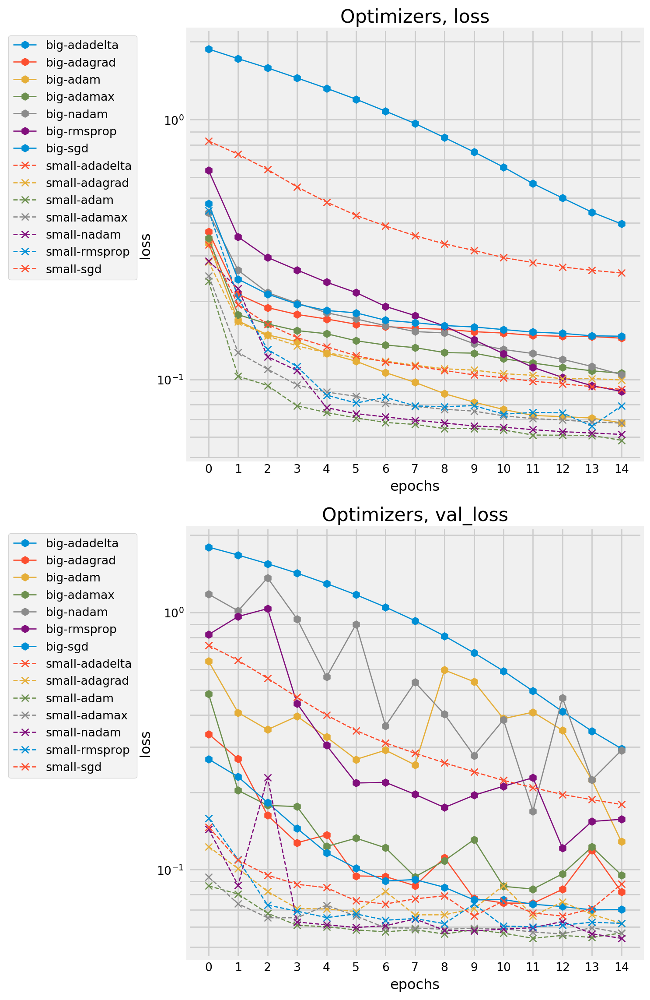

In [10]:
from matplotlib.colors import LinearSegmentedColormap 
plotkeys = ['loss', 'val_loss']

fig, axes = plt.subplots(2,1)

fig.set_dpi(192)
fig.set_size_inches(8,12)
axes = [ax for ax in axes]

for ix_, (ax, metric) in enumerate(zip(axes,plotkeys)):
    
    values_f = np.vstack(resdict[model][metric] 
                         for model in sorted(resdict.keys()))
    values_l = np.vstack(resdictlite[model][metric]
                         for model in sorted(resdictlite.keys()))
    
    legend = ['big-{}'.format(x) for x in resdict.keys()]
    ax.semilogy(values_f.T, linewidth=1,
                label=legend,
                marker='h', nonposy='clip',
                basey=10 )
    
    legend = ['small-{}'.format(x) for x in resdictlite.keys()]
    ax.semilogy(values_l.T,'--', linewidth=1,
                label=legend,
                marker='x', nonposy='clip',
                basey=10 )
    
    legend = ['big-{}'.format(x) for x in resdict.keys()]
    legend += ['small-{}'.format(x) for x in resdictlite.keys()]
    ax.set_title('Optimizers, {}'.format(metric), fontsize=16)
    ax.legend(legend,loc='upper right', bbox_to_anchor=(-0.1, 1),
              frameon=True)
    ax.set_xticks(np.arange(0,15,1))
    ax.set_xlabel('epochs')
    ax.grid(which='minor')
    ax.set_ylabel('loss')
    ax.set_yscale('log')
    ax.yaxis.grid(True)
    ax.xaxis.grid(True)

plt.tight_layout()   
plt.show()

### Training with augmented data and selected optimizer/model combination:

In [66]:
BATCH_SIZE = 32
model = facekey_net(30)

loadpath = 'data/modelsaves/facekeypoints_adadelta_facekey_main_best_model_weights.h5'
final_savepath = 'detector_architectures/facekeypoints_final_model.h5'
chkfilepath = 'data/modelsaves/facekeypoints_best_model.h5'

mcallbacks = [kerasnbtqdm, lrop, earlystop, chkptsave(chkfilepath)]

## Compile the model
model.compile(optimizer=rmsprop, 
              loss='mean_squared_error', 
              metrics=['accuracy',
                       'mean_absolute_error',
                       'mean_squared_error'])


model.load_weights(loadpath)
## Train the model

xvalid, yvalid = xtrain[1712:], ytrain[1712:]

print(augtrain.shape, augtruth.shape)

modlhist = modelhist = model.fit(augtrain[:1712], augtruth[:1712], 
                                 batch_size=BATCH_SIZE,
                                 epochs=1000,verbose=0, 
                                 callbacks=mcallbacks,
                                 validation_data=(xvalid,yvalid),
                                 shuffle=True,
                                 initial_epoch=16)

## Save the model as model.h5
model.save(final_savepath)

# save
import pickle

with open('data/cnndata/cnn_main_cnn_model_history.npy','wb') as file:
    pickle.dump(file=file, obj=modlhist.history,protocol=4)
    file.close()

(2568, 96, 96, 1) (2568, 30)



Epoch 00017: mean_squared_error improved from inf to 0.45662, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00018: mean_squared_error improved from 0.45662 to 0.13404, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00019: mean_squared_error improved from 0.13404 to 0.10993, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00020: mean_squared_error improved from 0.10993 to 0.07951, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00021: mean_squared_error improved from 0.07951 to 0.06063, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00022: mean_squared_error improved from 0.06063 to 0.04903, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00023: mean_squared_error improved from 0.04903 to 0.04104, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00024: mean_squared_error improved from 0.04104 to 0.03308, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00025: mean_squared_error improved from 0.03308 to 0.02667, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00026: mean_squared_error improved from 0.02667 to 0.02150, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00027: mean_squared_error improved from 0.02150 to 0.01707, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00028: mean_squared_error improved from 0.01707 to 0.01314, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00029: mean_squared_error improved from 0.01314 to 0.01124, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00030: mean_squared_error improved from 0.01124 to 0.00862, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00031: mean_squared_error did not improve from 0.00862



Epoch 00032: mean_squared_error improved from 0.00862 to 0.00834, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00033: mean_squared_error improved from 0.00834 to 0.00772, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00034: mean_squared_error improved from 0.00772 to 0.00733, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00035: mean_squared_error improved from 0.00733 to 0.00721, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00036: mean_squared_error improved from 0.00721 to 0.00676, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00037: mean_squared_error improved from 0.00676 to 0.00658, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00038: mean_squared_error improved from 0.00658 to 0.00647, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00039: mean_squared_error improved from 0.00647 to 0.00617, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00040: mean_squared_error improved from 0.00617 to 0.00589, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00041: mean_squared_error improved from 0.00589 to 0.00568, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00042: mean_squared_error improved from 0.00568 to 0.00550, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00043: mean_squared_error improved from 0.00550 to 0.00541, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00044: mean_squared_error improved from 0.00541 to 0.00511, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00045: mean_squared_error did not improve from 0.00511



Epoch 00046: mean_squared_error improved from 0.00511 to 0.00508, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00047: mean_squared_error improved from 0.00508 to 0.00498, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00048: mean_squared_error improved from 0.00498 to 0.00491, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00049: mean_squared_error improved from 0.00491 to 0.00488, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00050: mean_squared_error improved from 0.00488 to 0.00475, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00051: mean_squared_error improved from 0.00475 to 0.00454, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00052: mean_squared_error improved from 0.00454 to 0.00452, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00053: mean_squared_error did not improve from 0.00452



Epoch 00054: mean_squared_error improved from 0.00452 to 0.00434, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00055: mean_squared_error did not improve from 0.00434



Epoch 00056: mean_squared_error improved from 0.00434 to 0.00430, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00057: mean_squared_error improved from 0.00430 to 0.00410, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00058: mean_squared_error did not improve from 0.00410



Epoch 00059: mean_squared_error improved from 0.00410 to 0.00400, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00060: mean_squared_error improved from 0.00400 to 0.00394, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00061: mean_squared_error did not improve from 0.00394



Epoch 00062: mean_squared_error improved from 0.00394 to 0.00382, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00063: mean_squared_error did not improve from 0.00382



Epoch 00064: mean_squared_error improved from 0.00382 to 0.00374, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00065: mean_squared_error improved from 0.00374 to 0.00373, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00066: mean_squared_error did not improve from 0.00373



Epoch 00067: mean_squared_error improved from 0.00373 to 0.00362, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00068: mean_squared_error improved from 0.00362 to 0.00350, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00069: mean_squared_error improved from 0.00350 to 0.00344, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00070: mean_squared_error improved from 0.00344 to 0.00335, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00071: mean_squared_error did not improve from 0.00335



Epoch 00072: mean_squared_error improved from 0.00335 to 0.00330, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00073: mean_squared_error improved from 0.00330 to 0.00311, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00074: mean_squared_error did not improve from 0.00311



Epoch 00075: mean_squared_error did not improve from 0.00311



Epoch 00076: mean_squared_error improved from 0.00311 to 0.00309, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00077: mean_squared_error did not improve from 0.00309



Epoch 00078: mean_squared_error improved from 0.00309 to 0.00293, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00079: mean_squared_error improved from 0.00293 to 0.00293, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00080: mean_squared_error improved from 0.00293 to 0.00292, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00081: mean_squared_error improved from 0.00292 to 0.00287, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00082: mean_squared_error improved from 0.00287 to 0.00283, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00083: mean_squared_error improved from 0.00283 to 0.00277, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00084: mean_squared_error improved from 0.00277 to 0.00277, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00085: mean_squared_error improved from 0.00277 to 0.00273, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00086: mean_squared_error improved from 0.00273 to 0.00267, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00087: mean_squared_error improved from 0.00267 to 0.00258, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00088: mean_squared_error improved from 0.00258 to 0.00257, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00089: mean_squared_error did not improve from 0.00257



Epoch 00090: mean_squared_error did not improve from 0.00257



Epoch 00091: mean_squared_error improved from 0.00257 to 0.00244, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00092: mean_squared_error did not improve from 0.00244



Epoch 00093: mean_squared_error did not improve from 0.00244



Epoch 00094: mean_squared_error improved from 0.00244 to 0.00233, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00095: mean_squared_error improved from 0.00233 to 0.00232, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00096: mean_squared_error did not improve from 0.00232



Epoch 00097: mean_squared_error improved from 0.00232 to 0.00223, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00098: mean_squared_error did not improve from 0.00223



Epoch 00099: mean_squared_error did not improve from 0.00223



Epoch 00100: mean_squared_error did not improve from 0.00223



Epoch 00101: mean_squared_error improved from 0.00223 to 0.00215, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00102: mean_squared_error improved from 0.00215 to 0.00211, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00103: mean_squared_error did not improve from 0.00211



Epoch 00104: mean_squared_error did not improve from 0.00211



Epoch 00105: mean_squared_error improved from 0.00211 to 0.00206, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00106: mean_squared_error improved from 0.00206 to 0.00199, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00107: mean_squared_error did not improve from 0.00199



Epoch 00108: mean_squared_error improved from 0.00199 to 0.00198, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00109: mean_squared_error improved from 0.00198 to 0.00191, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00110: mean_squared_error did not improve from 0.00191



Epoch 00111: mean_squared_error improved from 0.00191 to 0.00190, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00112: mean_squared_error improved from 0.00190 to 0.00189, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00113: mean_squared_error improved from 0.00189 to 0.00184, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00114: mean_squared_error did not improve from 0.00184



Epoch 00115: mean_squared_error did not improve from 0.00184



Epoch 00116: mean_squared_error improved from 0.00184 to 0.00174, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00117: mean_squared_error did not improve from 0.00174



Epoch 00118: mean_squared_error improved from 0.00174 to 0.00171, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00119: mean_squared_error did not improve from 0.00171



Epoch 00120: mean_squared_error did not improve from 0.00171



Epoch 00121: mean_squared_error improved from 0.00171 to 0.00168, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00122: mean_squared_error improved from 0.00168 to 0.00167, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00123: mean_squared_error improved from 0.00167 to 0.00163, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00124: mean_squared_error did not improve from 0.00163



Epoch 00125: mean_squared_error improved from 0.00163 to 0.00161, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00126: mean_squared_error improved from 0.00161 to 0.00160, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00127: mean_squared_error improved from 0.00160 to 0.00154, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00128: mean_squared_error did not improve from 0.00154



Epoch 00129: mean_squared_error did not improve from 0.00154



Epoch 00130: mean_squared_error did not improve from 0.00154



Epoch 00131: mean_squared_error improved from 0.00154 to 0.00151, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00132: mean_squared_error did not improve from 0.00151



Epoch 00133: mean_squared_error improved from 0.00151 to 0.00149, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00134: mean_squared_error improved from 0.00149 to 0.00148, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00135: mean_squared_error improved from 0.00148 to 0.00145, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00136: mean_squared_error improved from 0.00145 to 0.00142, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00137: mean_squared_error did not improve from 0.00142



Epoch 00138: mean_squared_error did not improve from 0.00142



Epoch 00139: mean_squared_error improved from 0.00142 to 0.00141, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00140: mean_squared_error did not improve from 0.00141



Epoch 00141: mean_squared_error improved from 0.00141 to 0.00136, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00142: mean_squared_error did not improve from 0.00136



Epoch 00143: mean_squared_error did not improve from 0.00136



Epoch 00144: mean_squared_error improved from 0.00136 to 0.00135, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00145: mean_squared_error improved from 0.00135 to 0.00133, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00146: mean_squared_error improved from 0.00133 to 0.00127, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00147: mean_squared_error did not improve from 0.00127



Epoch 00148: mean_squared_error did not improve from 0.00127



Epoch 00149: mean_squared_error did not improve from 0.00127



Epoch 00150: mean_squared_error did not improve from 0.00127



Epoch 00151: mean_squared_error improved from 0.00127 to 0.00123, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00152: mean_squared_error did not improve from 0.00123



Epoch 00153: mean_squared_error improved from 0.00123 to 0.00122, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00154: mean_squared_error did not improve from 0.00122



Epoch 00155: mean_squared_error improved from 0.00122 to 0.00121, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00156: mean_squared_error improved from 0.00121 to 0.00116, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00157: mean_squared_error did not improve from 0.00116



Epoch 00158: mean_squared_error did not improve from 0.00116



Epoch 00159: mean_squared_error did not improve from 0.00116



Epoch 00160: mean_squared_error improved from 0.00116 to 0.00114, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00161: mean_squared_error improved from 0.00114 to 0.00113, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00162: mean_squared_error improved from 0.00113 to 0.00112, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00163: mean_squared_error improved from 0.00112 to 0.00110, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00164: mean_squared_error did not improve from 0.00110



Epoch 00165: mean_squared_error did not improve from 0.00110



Epoch 00166: mean_squared_error did not improve from 0.00110



Epoch 00167: mean_squared_error improved from 0.00110 to 0.00108, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00168: mean_squared_error improved from 0.00108 to 0.00107, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00169: mean_squared_error did not improve from 0.00107



Epoch 00170: mean_squared_error improved from 0.00107 to 0.00105, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00171: mean_squared_error did not improve from 0.00105



Epoch 00172: mean_squared_error did not improve from 0.00105



Epoch 00173: mean_squared_error improved from 0.00105 to 0.00103, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00174: mean_squared_error improved from 0.00103 to 0.00101, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00175: mean_squared_error did not improve from 0.00101



Epoch 00176: mean_squared_error did not improve from 0.00101



Epoch 00177: mean_squared_error improved from 0.00101 to 0.00100, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00178: mean_squared_error did not improve from 0.00100



Epoch 00179: mean_squared_error improved from 0.00100 to 0.00099, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00180: mean_squared_error did not improve from 0.00099



Epoch 00181: mean_squared_error improved from 0.00099 to 0.00097, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00182: mean_squared_error improved from 0.00097 to 0.00097, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00183: mean_squared_error improved from 0.00097 to 0.00094, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00184: mean_squared_error did not improve from 0.00094



Epoch 00185: mean_squared_error improved from 0.00094 to 0.00094, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00186: mean_squared_error improved from 0.00094 to 0.00093, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00187: mean_squared_error did not improve from 0.00093



Epoch 00188: mean_squared_error improved from 0.00093 to 0.00092, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00189: mean_squared_error did not improve from 0.00092



Epoch 00190: mean_squared_error improved from 0.00092 to 0.00090, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00191: mean_squared_error did not improve from 0.00090



Epoch 00192: mean_squared_error improved from 0.00090 to 0.00088, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00193: mean_squared_error did not improve from 0.00088



Epoch 00194: mean_squared_error did not improve from 0.00088



Epoch 00195: mean_squared_error improved from 0.00088 to 0.00088, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00196: mean_squared_error did not improve from 0.00088



Epoch 00197: mean_squared_error improved from 0.00088 to 0.00084, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00198: mean_squared_error did not improve from 0.00084



Epoch 00199: mean_squared_error did not improve from 0.00084



Epoch 00200: mean_squared_error did not improve from 0.00084



Epoch 00201: mean_squared_error improved from 0.00084 to 0.00084, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00202: mean_squared_error improved from 0.00084 to 0.00082, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00203: mean_squared_error did not improve from 0.00082



Epoch 00204: mean_squared_error improved from 0.00082 to 0.00081, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00205: mean_squared_error did not improve from 0.00081



Epoch 00206: mean_squared_error improved from 0.00081 to 0.00081, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00207: mean_squared_error improved from 0.00081 to 0.00081, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00208: mean_squared_error did not improve from 0.00081



Epoch 00209: mean_squared_error improved from 0.00081 to 0.00079, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00210: mean_squared_error did not improve from 0.00079



Epoch 00211: mean_squared_error improved from 0.00079 to 0.00078, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00212: mean_squared_error improved from 0.00078 to 0.00075, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00213: mean_squared_error did not improve from 0.00075



Epoch 00214: mean_squared_error did not improve from 0.00075



Epoch 00215: mean_squared_error did not improve from 0.00075



Epoch 00216: mean_squared_error improved from 0.00075 to 0.00075, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00217: mean_squared_error improved from 0.00075 to 0.00073, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00218: mean_squared_error did not improve from 0.00073



Epoch 00219: mean_squared_error did not improve from 0.00073



Epoch 00220: mean_squared_error did not improve from 0.00073



Epoch 00221: mean_squared_error did not improve from 0.00073



Epoch 00222: mean_squared_error improved from 0.00073 to 0.00072, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00223: mean_squared_error did not improve from 0.00072



Epoch 00224: mean_squared_error improved from 0.00072 to 0.00071, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00225: mean_squared_error improved from 0.00071 to 0.00070, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00226: mean_squared_error did not improve from 0.00070



Epoch 00227: mean_squared_error did not improve from 0.00070



Epoch 00228: mean_squared_error improved from 0.00070 to 0.00066, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00229: mean_squared_error did not improve from 0.00066



Epoch 00230: mean_squared_error did not improve from 0.00066



Epoch 00231: mean_squared_error did not improve from 0.00066



Epoch 00232: mean_squared_error did not improve from 0.00066



Epoch 00233: ReduceLROnPlateau reducing learning rate to 0.00031622778103685084.

Epoch 00233: mean_squared_error did not improve from 0.00066



Epoch 00234: mean_squared_error improved from 0.00066 to 0.00047, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00235: mean_squared_error improved from 0.00047 to 0.00040, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00236: mean_squared_error improved from 0.00040 to 0.00039, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00237: mean_squared_error improved from 0.00039 to 0.00038, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00238: mean_squared_error did not improve from 0.00038



Epoch 00239: mean_squared_error did not improve from 0.00038



Epoch 00240: mean_squared_error improved from 0.00038 to 0.00037, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00241: mean_squared_error did not improve from 0.00037



Epoch 00242: mean_squared_error did not improve from 0.00037



Epoch 00243: mean_squared_error improved from 0.00037 to 0.00036, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00244: mean_squared_error improved from 0.00036 to 0.00035, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00245: mean_squared_error did not improve from 0.00035



Epoch 00246: mean_squared_error improved from 0.00035 to 0.00035, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00247: mean_squared_error improved from 0.00035 to 0.00034, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00248: mean_squared_error improved from 0.00034 to 0.00034, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00249: mean_squared_error improved from 0.00034 to 0.00034, saving model to data/modelsaves/facekeypoints_best_model.h5



Epoch 00250: mean_squared_error did not improve from 0.00034


---
<a id='step7'></a>

## Step 7: Visualize the Loss and Test Predictions

### (IMPLEMENTATION)  Answer a few questions and visualize the loss

__Question 1:__ Outline the steps you took to get to your final neural network architecture and your reasoning at each step.

__Answer:__ Since this a visual feature extraction task, i have used a convolutional neural network with a final dense linear regressor. I have finalized on 2 of such models, the first one is a smaller network while the second is a wider/deeper network, with both models having by and large similar architectures.

The smaller models has 3 convolutional blocks, and uses 5x5 kernels with 5x5 pooling, input batch normalization and selu activations for all layers except the last linear dense layer. The bigger models also has 3 convolutional blocks but has ~2x more units per layer, and uses repeated batch normalizations on convolutional activations.

data augmentation features were built to account for the limited size of the data, but testing has not really shown prediction improvements for any of the models.

a custom loss function for rmse was also used as it wasnt available in keras.

__Question 2:__ Defend your choice of optimizer.  Which optimizers did you test, and how did you determine which worked best?

__Answer:__ I have chosen adagrad as my optimizer, as it was amongst the best performing optimizers with lowest validation losses, as observed in testing, along with rmsprop and other adaptive methods.


Use the code cell below to plot the training and validation loss of your neural network.  You may find [this resource](http://machinelearningmastery.com/display-deep-learning-model-training-history-in-keras/) useful.

dict_keys(['val_loss', 'val_acc', 'val_mean_absolute_error', 'val_mean_squared_error', 'loss', 'acc', 'mean_absolute_error', 'mean_squared_error', 'lr'])


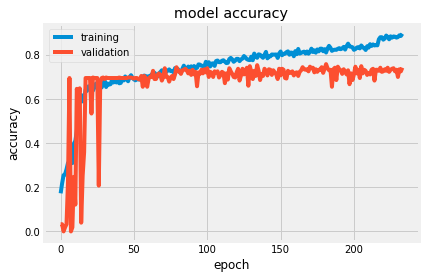

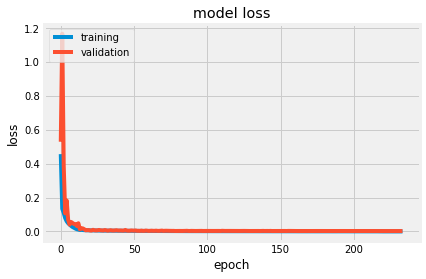

In [11]:
## Visualize the training and validation loss of your neural network

#load
import pickle

with open('data/cnndata/cnn_main_cnn_model_history.npy','rb') as file:
    mhistory = pickle.load(file)
    file.close()

print(mhistory.keys())

plt.plot(mhistory['acc'])
plt.plot(mhistory['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['training', 'validation'], loc='upper left')
plt.show()

plt.plot(mhistory['loss'])
plt.plot(mhistory['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['training', 'validation'], loc='upper left')
plt.show()

In [12]:
max(mhistory['acc'])

0.897196261682243

__Question 3:__  Do you notice any evidence of overfitting or underfitting in the above plot?  If so, what steps have you taken to improve your model?  Note that slight overfitting or underfitting will not hurt your chances of a successful submission, as long as you have attempted some solutions towards improving your model (such as _regularization, dropout, increased/decreased number of layers, etc_).

__Answer:__ Both the models have a tendency to overfit on extended training, and this is especially true for the bigger model which continues to train very well beyond the 250 epochs, and needs no intervention from the lr schedulers, adding dropout helps in limiting this somewhat, but with extended training this model is capable reducing the losses to less than 0.00015 (~10x lower than threshold requirement).

### Visualize a Subset of the Test Predictions

Execute the code cell below to visualize your model's predicted keypoints on a subset of the testing images.

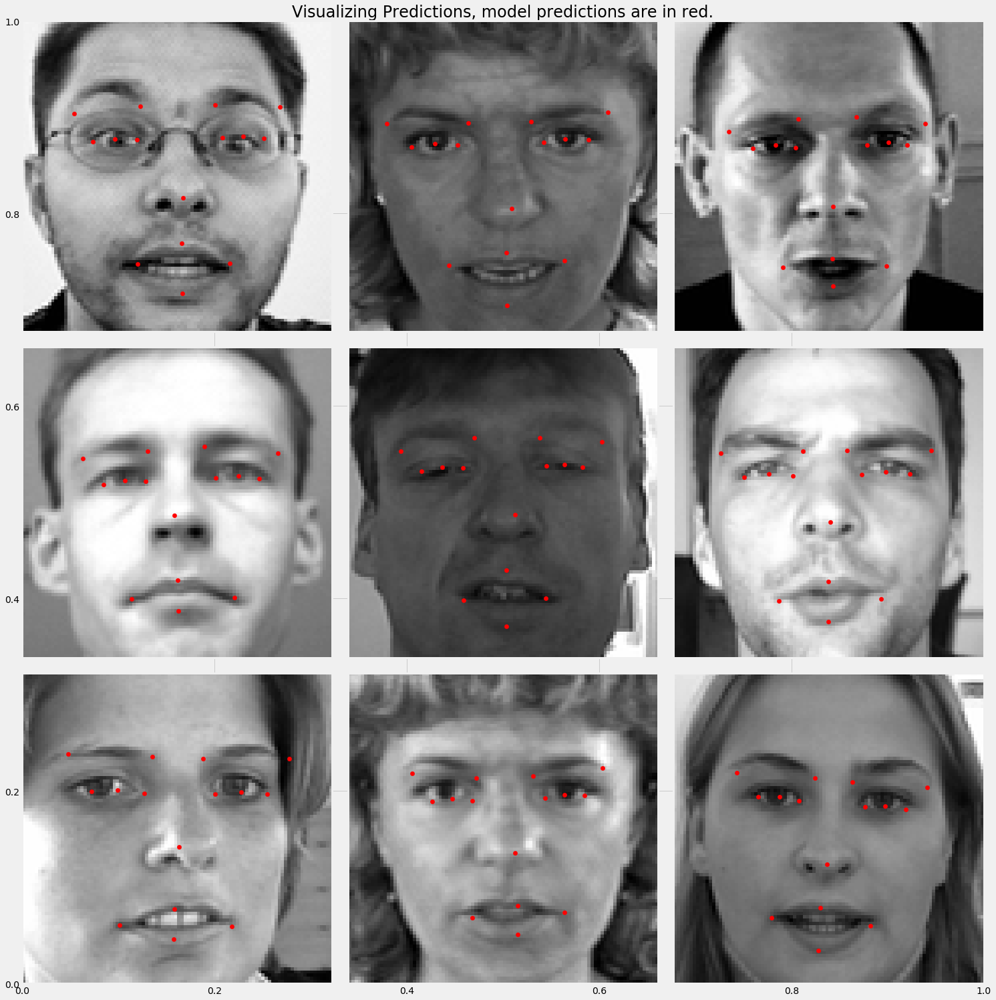

In [16]:
vizfilepath = 'data/modelsaves/facekeypoints_best_model.h5'

model = facekey_net(30)
model.compile(optimizer=adagrad, 
              loss='mse', 
              metrics=['mse',])
model.load_weights(vizfilepath)

y_test = model.predict(X_test)
fig = plt.figure(figsize=(20,20))
fig.subplots_adjust(left=0, right=1, bottom=0, top=1, hspace=0.05, wspace=0.05)
plt.title('Visualizing Predictions, model predictions are in red.', fontsize=24)
for i in range(9):
    ax = fig.add_subplot(3, 3, i + 1, xticks=[], yticks=[])
    plot_data(X_test[i], y_test[i], ax, 'r')

---
<a id='step8'></a>

## Step 8: Complete the pipeline

With the work you did in Sections 1 and 2 of this notebook, along with your freshly trained facial keypoint detector, you can now complete the full pipeline.  That is given a color image containing a person or persons you can now 

- Detect the faces in this image automatically using OpenCV
- Predict the facial keypoints in each face detected in the image
- Paint predicted keypoints on each face detected

In this Subsection you will do just this!  

### (IMPLEMENTATION) Facial Keypoints Detector

Use the OpenCV face detection functionality you built in previous Sections to expand the functionality of your keypoints detector to color images with arbitrary size.  Your function should perform the following steps

1. Accept a color image.
2. Convert the image to grayscale.
3. Detect and crop the face contained in the image.
4. Locate the facial keypoints in the cropped image.
5. Overlay the facial keypoints in the original (color, uncropped) image.

**Note**: step 4 can be the trickiest because remember your convolutional network is only trained to detect facial keypoints in $96 \times 96$ grayscale images where each pixel was normalized to lie in the interval $[0,1]$, and remember that each facial keypoint was normalized during training to the interval $[-1,1]$.  This means - practically speaking - to paint detected keypoints onto a test face you need to perform this same pre-processing to your candidate face  - that is after detecting it you should resize it to $96 \times 96$ and normalize its values before feeding it into your facial keypoint detector.  To be shown correctly on the original image the output keypoints from your detector then need to be shifted and re-normalized from the interval $[-1,1]$ to the width and height of your detected face.

When complete you should be able to produce example images like the one below

<img src="images/obamas_with_keypoints.png" width=1000 height=1000/>

In [17]:
### Use the face detection code we saw in Section 1 with your trained conv-net 
## Paint the predicted keypoints on the test image

cv_face_haar = 'detector_architectures/haarcascade_frontalface_default.xml'
cvdetector = cv2.CascadeClassifier(cv_face_haar)

mmod_cnn_weights: str = 'detector_architectures/mmod_human_face_detector.dat'
dlibcnndetect = dlib.cnn_face_detection_model_v1(mmod_cnn_weights)

def tocvrect(f: dlib.mmod_rectangle) -> np.ndarray:
    l, t, = f.left(), f.top()
    r, b =  f.right() - l, f.bottom() - t
    return np.array([l, t, r, b]).astype(np.int)

def getdlibface(gray: np.ndarray, upsamplenum: int=1) -> np.ndarray:
    gray = dlib.resize_image(gray, gray.shape[0], gray.shape[1])
    faces = dlibcnndetect(gray, 2)
    faces = np.array([tocvrect(face.rect) for face in faces])
    return faces

def getcvfaces(gray: np.ndarray, upsamplenum: int=1) -> np.ndarray:
    faces = cvdetector.detectMultiScale(gray, 1.25, 6)
    return faces

def imgkeyptpipe(keyptmodel: object, rgbimage:np.ndarray) -> np.ndarray:
    
    # commons
    dlibgray: np.ndarray = dlib.as_grayscale(rgbimage)
    rgbimage: np.ndarray = rgbimage / 255.0
    grayimg: np.ndarray = dlibgray / 255.0
    
    # dlib face extraction)
    # extract faces with one upscale
    faces: np.ndarray = getcvfaces(dlibgray, 1)
    # print('NUM FACES: {}'.format(len(faces)))
    allfaces: np.ndarray = np.zeros((len(faces),15,2),dtype=np.int)
    for ix_ in range(0, len(faces)):
        
        (x,y,w,h) = faces[ix_]
        
        # extract face roi and prepare array for model
        rw, rh = int(w), int(h)
        ptscale: (int, int) = (rw/96.0, rh/96.0)
        modelface = grayimg[y:y+rh, x:x+rw]
        modelface = dlib.resize_image(modelface, 96, 96)/255.0
        modelface = np.expand_dims(modelface, axis=-1)
        modelface = np.expand_dims(modelface, axis=0)
        
        # predict
        facemarks: [] = keyptmodel.predict(modelface)
        
        # undo the normalization
        facemarks = facemarks.ravel()*48 + 48
        xfacemarks: [] = facemarks[0::2]*ptscale[0] + x
        yfacemarks: [] = facemarks[1::2]*ptscale[1] + y
        
        #store
        allfaces[ix_] = np.vstack([xfacemarks, yfacemarks]).T
        
        #overlay face
        cv2.rectangle(rgbimage, (x,y), (x+rw,y+rh), (0.0,0,1.0), 3)
        
    # draw points
    [cv2.circle(rgbimage, (z[0],z[1]), 3, (0.0, 1.0, 0.0), -1) 
     for z in allfaces.reshape(-1,2)[::1,:]]
    
    return rgbimage

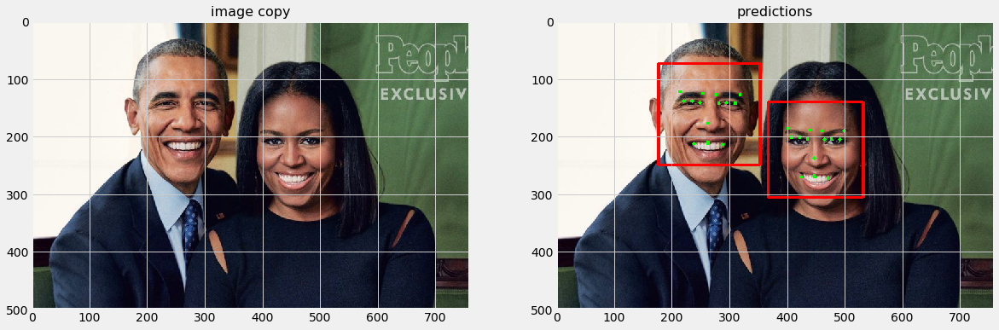

In [18]:
### Use the face detection code we saw in Section 1 with your trained conv-net 
## Paint the predicted keypoints on the test image
# Load in color image for face detection
image = cv2.imread('images/obamas4.jpg', 1)

# plot our image
fig = plt.figure(figsize = (18,9))
ax1 = fig.add_subplot(121)
ax1.set_title('image copy', fontsize=16)
ax1.imshow(image[:,:,::-1])

model = facekey_net(30)
model.compile(optimizer=adagrad,
              loss='mse',
              metrics=['mse',])

vizfilepath = 'data/modelsaves/facekeypoints_best_model.h5'
model.load_weights(vizfilepath)


finalimg = imgkeyptpipe(model, image)

ax2 = fig.add_subplot(122)
ax2.set_title('predictions', fontsize=16)
ax2.imshow(finalimg[:,:,::-1])

plt.show()

In [19]:
%timeit imgkeyptpipe(model,image)

37.3 ms ± 964 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


### (Optional) Further Directions - add a filter using facial keypoints to your laptop camera

Now you can add facial keypoint detection to your laptop camera - as illustrated in the gif below.

<img src="images/facial_keypoint_test.gif" width=400 height=300/>

The next Python cell contains the basic laptop video camera function used in the previous optional video exercises.  Combine it with the functionality you developed for keypoint detection and marking in the previous exercise and you should be good to go!

In [20]:
from core.videotools import *
import cv2
import time 
from keras.models import load_model

def laptop_camera_go(model):
    # Create instance of video capturer
    cv2.namedWindow("face detection activated")
    vc = cv2.VideoCapture(0)

    # Try to get the first frame
    if vc.isOpened(): 
        rval, frame = vc.read()
    else:
        rval = False
    
    # keep video stream open
    while rval:
        # plot image from camera with detections marked
        cv2.imshow("face detection activated", imgkeyptpipe(model, frame))
        
        # exit functionality - press any key to exit laptop video
        key = cv2.waitKey(20)
        if key > 0: # exit by pressing any key
            # destroy windows
            del frame, rval, vc
            cv2.destroyAllWindows()
            
            # hack from stack overflow for making sure window closes on osx --> https://stackoverflow.com/questions/6116564/destroywindow-does-not-close-window-on-mac-using-python-and-opencv
            for i in range (1,5):
                cv2.waitKey(1)
            return
        
        # read next frame
        time.sleep(0.0166)             # control framerate for computation - default 20 frames per sec
        rval, frame = vc.read()  

In [ ]:
# Run your keypoint face painter

model = facekey_net(30)
model.compile(optimizer=nadam,
              loss='mse',
              metrics=['mse',])

vizfilepath = 'data/modelsaves/facekeypoints_best_model.h5'
model.load_weights(vizfilepath)

laptop_camera_go(model)


### (Optional) Further Directions - add a filter using facial keypoints

Using your freshly minted facial keypoint detector pipeline you can now do things like add fun filters to a person's face automatically.  In this optional exercise you can play around with adding sunglasses automatically to each individual's face in an image as shown in a demonstration image below.

<img src="images/obamas_with_shades.png" width=1000 height=1000/>

To produce this effect an image of a pair of sunglasses shown in the Python cell below.

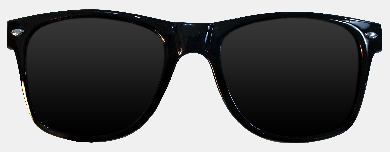

In [22]:
# Load in sunglasses image - note the usage of the special option
# cv2.IMREAD_UNCHANGED, this option is used because the sunglasses 
# image has a 4th channel that allows us to control how transparent each pixel in the image is
sunglasses = cv2.imread("images/sunglasses_4.png", cv2.IMREAD_UNCHANGED)

# Plot the image
fig = plt.figure(figsize = (6,6))
ax1 = fig.add_subplot(111)
ax1.set_xticks([])
ax1.set_yticks([])
ax1.imshow(sunglasses)
ax1.axis('off');

This image is placed over each individual's face using the detected eye points to determine the location of the sunglasses, and eyebrow points to determine the size that the sunglasses should be for each person (one could also use the nose point to determine this).  

Notice that this image actually has *4 channels*, not just 3. 

In [23]:
# Print out the shape of the sunglasses image
print ('The sunglasses image has shape: ' + str(np.shape(sunglasses)))

The sunglasses image has shape: (1123, 3064, 4)


It has the usual red, blue, and green channels any color image has, with the 4th channel representing the transparency level of each pixel in the image.  Here's how the transparency channel works: the lower the value, the more transparent the pixel will become.  The lower bound (completely transparent) is zero here, so any pixels set to 0 will not be seen. 

This is how we can place this image of sunglasses on someone's face and still see the area around of their face where the sunglasses lie - because these pixels in the sunglasses image have been made completely transparent.

Lets check out the alpha channel of our sunglasses image in the next Python cell.  Note because many of the pixels near the boundary are transparent we'll need to explicitly print out non-zero values if we want to see them. 

In [24]:
# Print out the sunglasses transparency (alpha) channel
alpha_channel = sunglasses[:,:,3]
print ('the alpha channel here looks like')
print (alpha_channel)

# Just to double check that there are indeed non-zero values
# Let's find and print out every value greater than zero
values = np.where(alpha_channel != 0)
print ('\n the non-zero values of the alpha channel look like')
print (values)

the alpha channel here looks like
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]

 the non-zero values of the alpha channel look like
(array([  17,   17,   17, ..., 1109, 1109, 1109], dtype=int64), array([ 687,  688,  689, ..., 2376, 2377, 2378], dtype=int64))


This means that when we place this sunglasses image on top of another image, we can use the transparency channel as a filter to tell us which pixels to overlay on a new image (only the non-transparent ones with values greater than zero).

One last thing: it's helpful to understand which keypoint belongs to the eyes, mouth, etc. So, in the image below, we also display the index of each facial keypoint directly on the image so that you can tell which keypoints are for the eyes, eyebrows, etc.

<img src="images/obamas_points_numbered.png" width=500 height=500/>

With this information, you're well on your way to completing this filtering task!  See if you can place the sunglasses automatically on the individuals in the image loaded in / shown in the next Python cell.

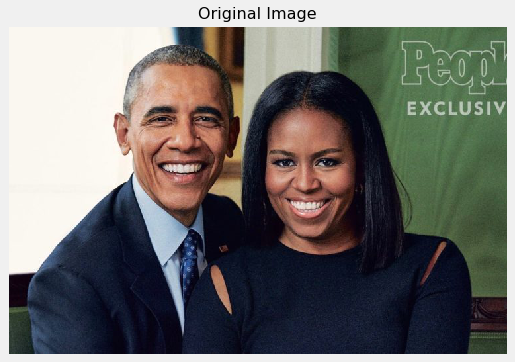

In [25]:
# Load in color image for face detection
image = cv2.imread('images/obamas4.jpg')

# Convert the image to RGB colorspace
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)


# Plot the image
fig = plt.figure(figsize = (8,8))
ax1 = fig.add_subplot(111)
ax1.set_xticks([])
ax1.set_yticks([])
ax1.set_title('Original Image', fontsize=16)
ax1.imshow(image)

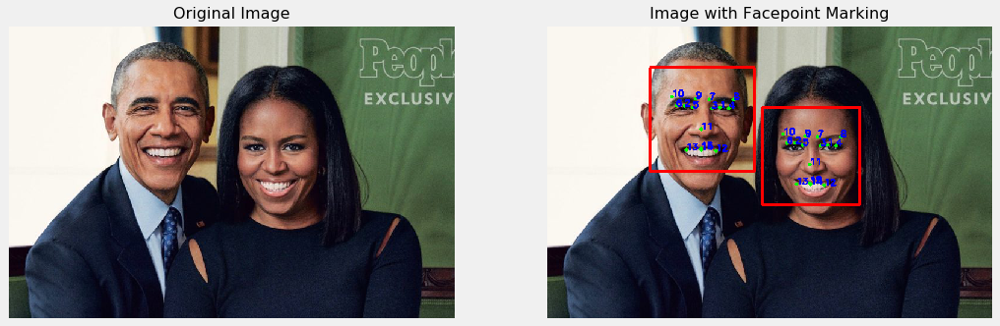

In [26]:
# get facepoimts

def img_to_facepts(keyptmodel: object, rgbimage:np.ndarray) -> np.ndarray:
    
    # commons
    dlibgray: np.ndarray = dlib.as_grayscale(rgbimage)
    rgbimage: np.ndarray = rgbimage / 255.0
    grayimg: np.ndarray = dlibgray / 255.0
    
    # dlib face extraction)
    # extract faces with one upscale
    faces: np.ndarray = getcvfaces(dlibgray, 1)
    # print('NUM FACES: {}'.format(len(faces)))
    all_points: np.ndarray = np.zeros((len(faces),15,2),dtype=np.int)
    for ix_ in range(0, len(faces)):
        
        (x,y,w,h) = faces[ix_]
        
        # extract face roi and prepare array for model
        rw, rh = int(w), int(h)
        ptscale: (int, int) = (rw/96.0, rh/96.0)
        modelface = grayimg[y:y+rh, x:x+rw]
        modelface = dlib.resize_image(modelface, 96, 96)/255.0
        modelface = np.expand_dims(modelface, axis=-1)
        modelface = np.expand_dims(modelface, axis=0)
        
        # predict
        facemarks: [] = keyptmodel.predict(modelface)
        
        # undo the normalization
        facemarks = facemarks.ravel()*48 + 48
        xfacemarks: [] = facemarks[0::2]*ptscale[0] + x
        yfacemarks: [] = facemarks[1::2]*ptscale[1] + y
        
        #store
        all_points[ix_] = np.vstack([xfacemarks, yfacemarks]).T
        
        #overlay face
        cv2.rectangle(rgbimage, (x,y), (x+rw,y+rh), (0.0,0,1.0), 3)
        
    # draw points
    [cv2.circle(rgbimage, (z[0],z[1]), 3, (0.0, 1.0, 0.0), -1) 
     for z in all_points.reshape(-1,2)[::1,:]]
    
    return rgbimage, all_points

image = np.copy(image)
predicted_image, face_pts = img_to_facepts(model, image[:,:,::-1])
font = cv2.FONT_HERSHEY_SIMPLEX

for face_pt in face_pts:
    for ix_,(x,y) in enumerate(face_pt):
        cv2.putText(predicted_image, str(ix_+1), (x,y),
                    font, 0.5, (1.0,0.0,0.0), 2, cv2.LINE_AA)

# Plot the image
fig = plt.figure(2, figsize = (16,8))

ax1 = fig.add_subplot(121)
ax1.set_xticks([])
ax1.set_yticks([])
ax1.set_title('Original Image', fontsize=16)
ax1.imshow(image)

ax1 = fig.add_subplot(122)
ax1.set_xticks([])
ax1.set_yticks([])
ax1.set_title('Image with Facepoint Marking', fontsize=16)
ax1.imshow(predicted_image[:,:,::-1])

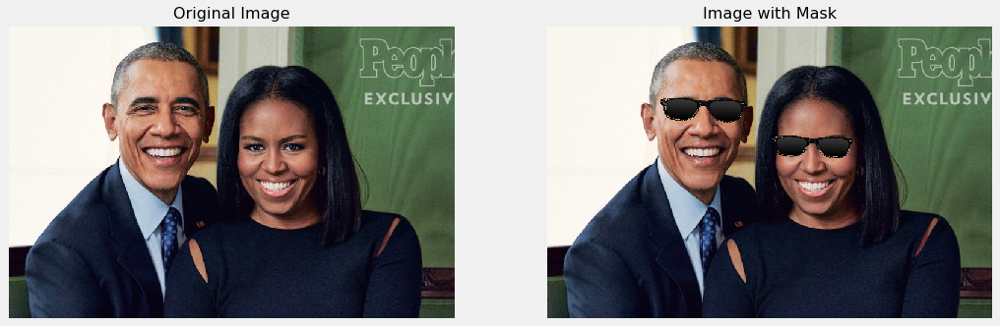

In [27]:
## (Optional) Use the face detection code we saw in Section 1 with your trained conv-net to put
## sunglasses on the individuals in our test image

image = cv2.imread('images/obamas4.jpg',1)

def put_glasses(model, image, maskimage, torgb=False):
    
    _, face_pts = img_to_facepts(model, image)
    
    resized_mask = cv2.resize(maskimage, (image.shape[1], image.shape[0]))
    src_height, src_width, src_channels = image.shape
    src_pts = np.float32([[0,0],[0, src_height-1],
                           [src_width-1, src_height-1],
                           [src_width-1, 0]])
    
    for face_pt in face_pts:
        rbrow = face_pt[7]
        lbrow = face_pt[9]
        nose = face_pt[10]

        mask_height = np.abs(rbrow[1] - nose[1]) * 0.8
        warpedmask = np.copy(resized_mask)
    
        dest_pts = np.float32([[rbrow[0]+20, rbrow[1]],
                              [rbrow[0]+20, rbrow[1]+mask_height],
                              [lbrow[0]-20, lbrow[1]+mask_height],
                              [lbrow[0]-20, lbrow[1]]])

        Persp_MAT = cv2.getPerspectiveTransform(src_pts, dest_pts)
        
        warpedmask = cv2.warpPerspective(resized_mask, Persp_MAT,
                                           (src_width, src_height),
                                           flags=cv2.INTER_LANCZOS4)
        masked = warpedmask[:,:,:3]
        masked[masked == 0] = 255
        #print(cimage.shape, masked.shape)
        image[masked != 255] = masked[masked != 255]
        
    if torgb:
        return image[:,:,::-1]
    else:
        return image

    
# Plot the image
fig = plt.figure(2, figsize = (16,8))

ax1 = fig.add_subplot(121)
ax1.set_xticks([])
ax1.set_yticks([])
ax1.set_title('Original Image', fontsize=16)
ax1.imshow(image[:,:,::-1])

ax1 = fig.add_subplot(122)
ax1.set_xticks([])
ax1.set_yticks([])
ax1.set_title('Image with Mask', fontsize=16)
ax1.imshow(put_glasses(model, image, sunglasses, True))

In [28]:
%timeit put_glasses(model, image, sunglasses)

26.6 ms ± 870 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


###  (Optional) Further Directions - add a filter using facial keypoints to your laptop camera 

Now you can add the sunglasses filter to your laptop camera - as illustrated in the gif below.

<img src="images/mr_sunglasses.gif" width=250 height=250/>

The next Python cell contains the basic laptop video camera function used in the previous optional video exercises.  Combine it with the functionality you developed for adding sunglasses to someone's face in the previous optional exercise and you should be good to go!

In [29]:
import cv2
import time 
from keras.models import load_model
import numpy as np

def laptop_camera_go():
    # Create instance of video capturer
    cv2.namedWindow("face detection activated")
    vc = cv2.VideoCapture(0)

    # try to get the first frame
    if vc.isOpened(): 
        rval, frame = vc.read()
    else:
        rval = False
    
    # Keep video stream open
    while rval:
        # Plot image from camera with detections marked
        frame = put_glasses(model, frame, sunglasses, False)
        cv2.imshow("face detection activated", frame)
        
        # Exit functionality - press any key to exit laptop video
        key = cv2.waitKey(20)
        if key > 0: # exit by pressing any key
            # Destroy windows 
            cv2.destroyAllWindows()
            
            for i in range (1,5):
                cv2.waitKey(1)
            return
        
        # Read next frame
        time.sleep(0.05)             # control framerate for computation - default 20 frames per sec
        rval, frame = vc.read()    
        

In [30]:
# Load facial landmark detector model
model = facekey_net(30)
model.compile(optimizer=adagrad,
              loss='mse',
              metrics=['mse',])

vizfilepath = 'data/modelsaves/facekeypoints_best_model.h5'
model.load_weights(vizfilepath)

# Run sunglasses painter
laptop_camera_go()